<a href="https://colab.research.google.com/github/Dimas0824/PCVK/blob/main/Pertemuan11/PCVK_WEEK11.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# D. TUGAS PRAKTIKUM

## D1. Praktikum Deteksi Obyek Dasar

**Object Detection**

Metode yang digunakan:
  1. Template Matching
  2. Edge Detection
  3. Corner Detection
  4. Grid Detection
  5. Contour Detection

### 1. Import library dan Load Dataset

In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

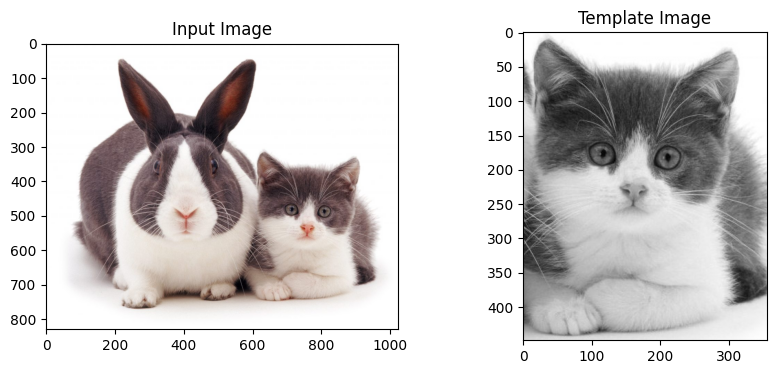

In [ ]:
img_path = '/content/drive/MyDrive/PCVK/Images/Images/Object Detection/cats_and_bunnies.jpg'
template_path = '/content/drive/MyDrive/PCVK/Images/Images/Object Detection/cat2_templatejpg.jpg'

# Baca gambar
img_rgb = cv.imread(img_path)
img_gray = cv.cvtColor(img_rgb, cv.COLOR_BGR2GRAY)
template = cv.imread(template_path, cv.IMREAD_GRAYSCALE)
h, w = template.shape

# Tampilkan gambar input & template
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(img_rgb, cv.COLOR_BGR2RGB))
plt.title('Input Image')

plt.subplot(1, 2, 2)
plt.imshow(template, cmap='gray')
plt.title('Template Image')
plt.show()

### 2. Implementasikan 6 metode template matching pada OpenCV dengan
menggunakan gambar cats_and_bunnies.jpg dan cat2_templatejpg.jpg sebagai
templatenya.

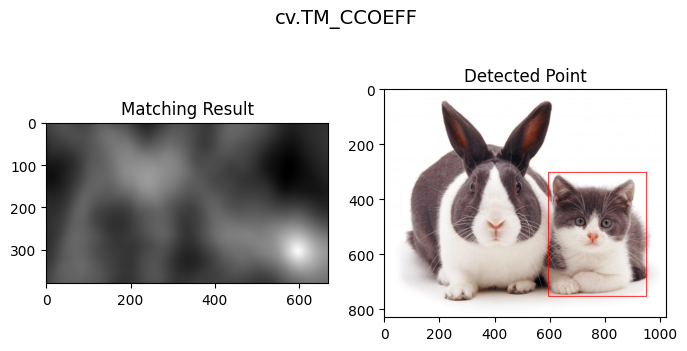

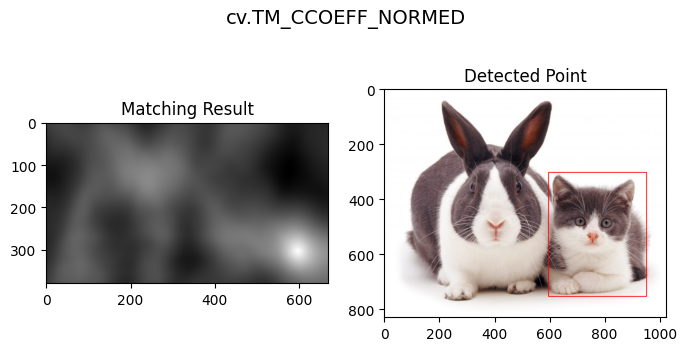

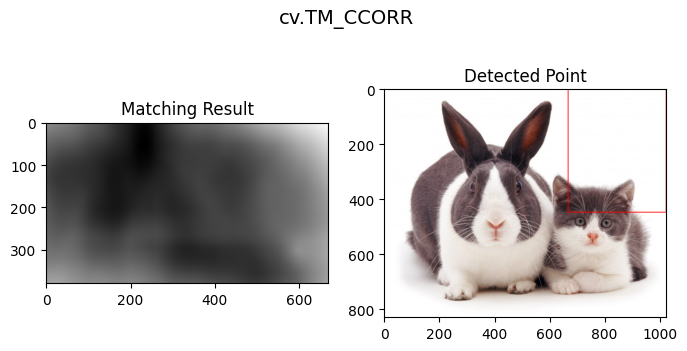

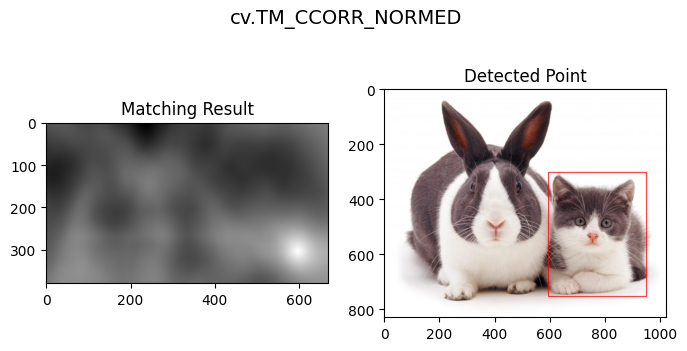

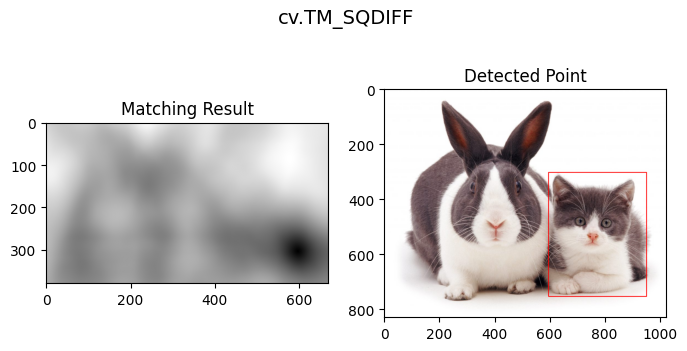

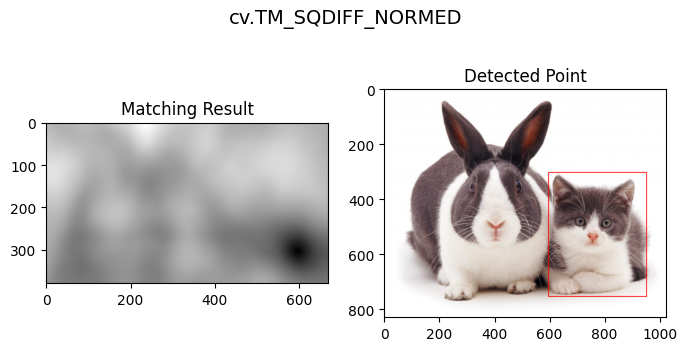

In [ ]:
methods = [
    ('cv.TM_CCOEFF', cv.TM_CCOEFF),
    ('cv.TM_CCOEFF_NORMED', cv.TM_CCOEFF_NORMED),
    ('cv.TM_CCORR', cv.TM_CCORR),
    ('cv.TM_CCORR_NORMED', cv.TM_CCORR_NORMED),
    ('cv.TM_SQDIFF', cv.TM_SQDIFF),
    ('cv.TM_SQDIFF_NORMED', cv.TM_SQDIFF_NORMED)
]

for name, method in methods:
    # Salin gambar
    img_copy = img_rgb.copy()

    # Lakukan template matching
    result = cv.matchTemplate(img_gray, template, method)
    min_val, max_val, min_loc, max_loc = cv.minMaxLoc(result)

    # Pilih koordinat terbaik
    if method in [cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED]:
        top_left = min_loc
    else:
        top_left = max_loc

    bottom_right = (top_left[0] + w, top_left[1] + h)
    cv.rectangle(img_copy, top_left, bottom_right, (0, 0, 255), 2)

    # Plot hasil
    plt.figure(figsize=(8, 4))
    plt.suptitle(name, fontsize=14)

    plt.subplot(1, 2, 1)
    plt.imshow(result, cmap='gray')
    plt.title('Matching Result')

    plt.subplot(1, 2, 2)
    plt.imshow(cv.cvtColor(img_copy, cv.COLOR_BGR2RGB))
    plt.title('Detected Point')

    plt.show()

### 3. Implementasikan konsep template matching tanpa menggunakan library OpenCV untuk multiple object, menggunakan gambar bahrain.jpg untuk citra masukan dan bahrain-template.jpg sebagai citra template, sehingga menghasilkan output sebagai berikut:

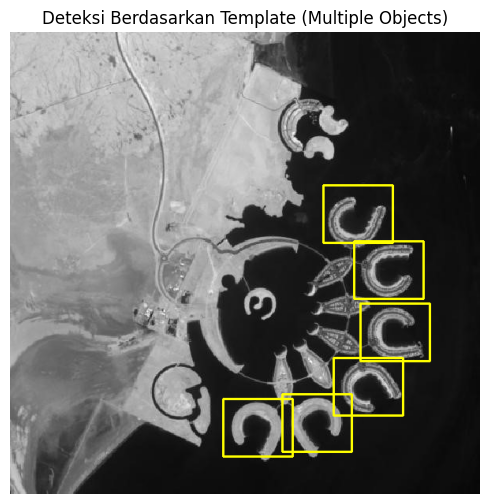

In [ ]:
# Path gambar dan template
img_path = '/content/drive/MyDrive/PCVK/Images/Images/Object Detection/bahrain.jpg'
template_path = '/content/drive/MyDrive/PCVK/Images/Images/Object Detection/bahrain-template.jpg'

# Baca gambar (grayscale)
img = cv.imread(img_path, cv.IMREAD_GRAYSCALE)
template = cv.imread(template_path, cv.IMREAD_GRAYSCALE)
img_color = cv.cvtColor(img, cv.COLOR_GRAY2BGR)

h, w = template.shape


def template_match_manual(image, template):
    ih, iw = image.shape
    th, tw = template.shape
    result = np.zeros((ih - th + 1, iw - tw + 1))

    template_mean = np.mean(template)
    template_std = np.std(template)
    template_norm = (template - template_mean) / (template_std + 1e-8)

    for y in range(result.shape[0]):
        for x in range(result.shape[1]):
            patch = image[y:y+th, x:x+tw]
            patch_mean = np.mean(patch)
            patch_std = np.std(patch)
            if patch_std < 1e-6:
                continue
            patch_norm = (patch - patch_mean) / patch_std
            result[y, x] = np.mean(patch_norm * template_norm)
    return result

# Proses deteksi
result = template_match_manual(img, template)

# Normalisasi hasil ke [0,1]
result = template_match_manual(img, template)
result_norm = (result - np.min(result)) / (np.max(result) - np.min(result))

# Threshold untuk mendeteksi multiple object
threshold = 0.65
coords = np.argwhere(result_norm >= threshold)

# Hindari kotak duplikat yang terlalu berdekatan
detected_points = []
min_distance = int(min(h, w) * 0.5)

for (y, x) in coords:
    # Cek apakah sudah ada kotak di sekitar titik ini
    if all(np.hypot(x - dx, y - dy) > min_distance for (dy, dx) in detected_points):
        detected_points.append((y, x))

# Gambar semua kotak hasil deteksi
for (y, x) in detected_points:
    cv.rectangle(img_color, (x, y), (x + w, y + h), (0, 255, 255), 2)


# VISUAL
plt.figure(figsize=(10, 6))
plt.title("Deteksi Berdasarkan Template (Multiple Objects)")
plt.imshow(cv.cvtColor(img_color, cv.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

### 4. Implementasikan metode Sobel Edge Detection, Canny Edge Detection, dan Laplacian Edge Detection pada OpenCV dengan menggunakan gambar car-park.jpg, sehingga menghasilkan luaran sebagai berikut:

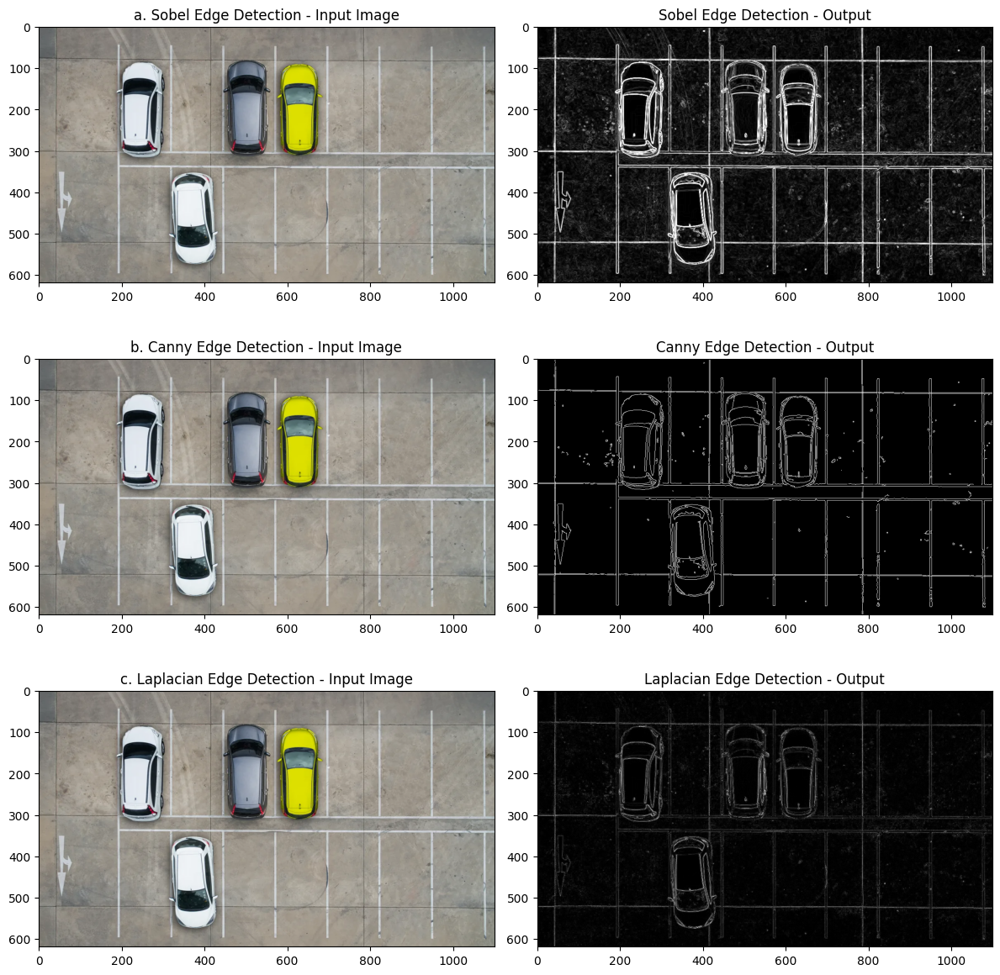

In [ ]:
# Path gambar
img_path = '/content/drive/MyDrive/PCVK/Images/Images/Object Detection/car-park.jpg'

# Baca gambar
img = cv.imread(img_path)
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# 1. SOBEL EDGE DETECTION
# Sobel X dan Y
sobelx = cv.Sobel(gray, cv.CV_64F, 1, 0, ksize=3)
sobely = cv.Sobel(gray, cv.CV_64F, 0, 1, ksize=3)

# Gabungkan (magnitude)
sobel_combined = cv.magnitude(sobelx, sobely)
sobel_combined = cv.convertScaleAbs(sobel_combined)

# 2. CANNY EDGE DETECTION
canny = cv.Canny(gray, 100, 200)

# 3. LAPLACIAN EDGE DETECTION
laplacian = cv.Laplacian(gray, cv.CV_64F)
laplacian = cv.convertScaleAbs(laplacian)

# VISUALISASI
plt.figure(figsize=(12, 12))

# a. Sobel
plt.subplot(3, 2, 1)
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title('a. Sobel Edge Detection - Input Image')

plt.subplot(3, 2, 2)
plt.imshow(sobel_combined, cmap='gray')
plt.title('Sobel Edge Detection - Output')

# b. Canny
plt.subplot(3, 2, 3)
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title('b. Canny Edge Detection - Input Image')

plt.subplot(3, 2, 4)
plt.imshow(canny, cmap='gray')
plt.title('Canny Edge Detection - Output')

# c. Laplacian
plt.subplot(3, 2, 5)
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title('c. Laplacian Edge Detection - Input Image')

plt.subplot(3, 2, 6)
plt.imshow(laplacian, cmap='gray')
plt.title('Laplacian Edge Detection - Output')

plt.tight_layout()
plt.show()

### 5. Implementasikan metode Harris Corner Detection dan Shi-Tomasi Detection pada OpenCV dengan menggunakan gambar chessboard.jpg, sehingga menghasilkan luaran sebagai berikut:

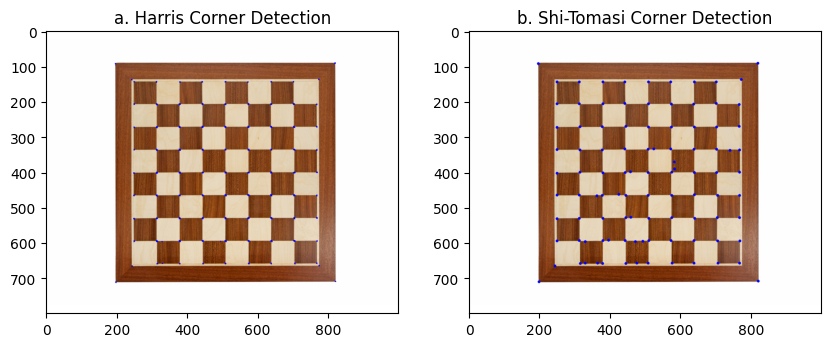

In [ ]:
# Path gambar
img_path = '/content/drive/MyDrive/PCVK/Images/Images/Object Detection/chess-board.jpg'

# Baca gambar
img = cv.imread(img_path)
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
gray = np.float32(gray)

# 1️. HARRIS CORNER DETECTION
# Gunakan Harris corner detector
dst = cv.cornerHarris(gray, blockSize=2, ksize=3, k=0.04)

# Dilasi agar sudut terlihat lebih jelas
dst_dilated = cv.dilate(dst, None)

# Threshold (titik dengan respons > 1% dari nilai max dianggap corner)
img_harris = img.copy()
img_harris[dst_dilated > 0.01 * dst_dilated.max()] = [255, 0, 0]  # warna merah

# 2. SHI-TOMASI CORNER DETECTION
img_shi = img.copy()
corners = cv.goodFeaturesToTrack(
    np.uint8(gray), maxCorners=100, qualityLevel=0.01, minDistance=10
)

# Convert dan gambar titik corner
corners = corners.astype(int)
for corner in corners:
    x, y = corner.ravel()
    cv.circle(img_shi, (x, y), 4, (255, 0, 0), -1)

# VISUALISASI
plt.figure(figsize=(10, 10))

# a. Harris Corner Detection
plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(img_harris, cv.COLOR_BGR2RGB))
plt.title('a. Harris Corner Detection')

# b. Shi-Tomasi Corner Detection
plt.subplot(1, 2, 2)
plt.imshow(cv.cvtColor(img_shi, cv.COLOR_BGR2RGB))
plt.title('b. Shi-Tomasi Corner Detection')

plt.show()

### 6. Implementasikan metode Hough Transform pada OpenCV dengan menggunakan gambar sudoku.jpg. Tahapan proses grid detection sesuai yang terdapat pada ulasan teori, sehingga menghasilkan luaran sebagai berikut:

Jumlah garis terdeteksi: 33
Jumlah garis setelah filter: 20


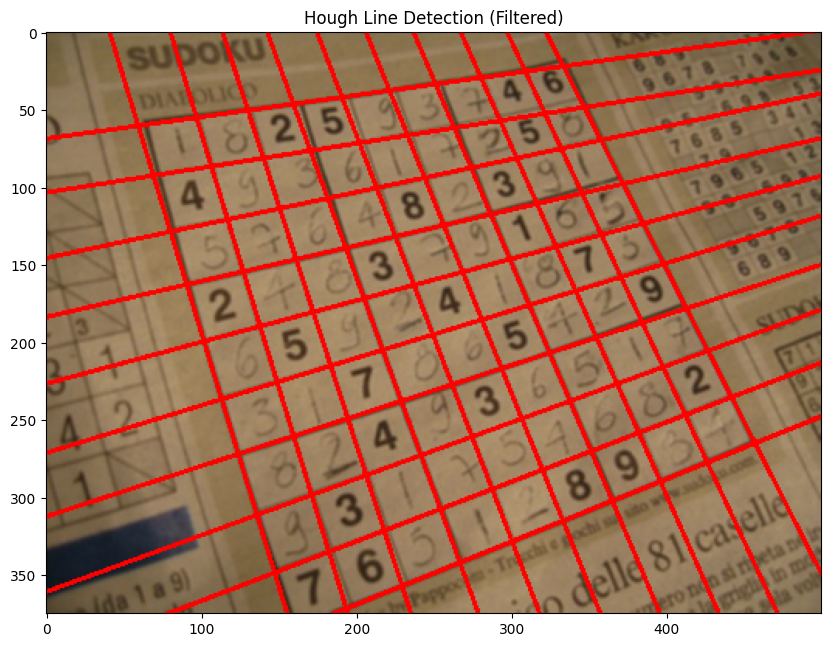

In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# 1. Baca gambar dan ubah ke grayscale
img_path = '/content/drive/MyDrive/PCVK/Images/Images/Object Detection/sudoku.jpg'
img = cv.imread(img_path)
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# 2. Edge detection
edges = cv.Canny(gray, 90, 150, apertureSize=3)

# 3. Dilasi dan erosi untuk memperkuat garis
kernel = np.ones((3, 3), np.uint8)
edges = cv.dilate(edges, kernel, iterations=1)
kernel = np.ones((5, 5), np.uint8)
edges = cv.erode(edges, kernel, iterations=1)

# 4. Hough Line Transform
lines = cv.HoughLines(edges, 1, np.pi/180, 150)

if lines is None or not lines.any():
    print('No lines were found')
    exit()

# 5. Filter garis mirip agar tidak double
rho_threshold = 15
theta_threshold = 0.1  # ~6 derajat toleransi
filtered_lines = []

for i in range(len(lines)):
    rho, theta = lines[i][0]
    duplicate = False
    for rho2, theta2 in filtered_lines:
        if abs(rho - rho2) < rho_threshold and abs(theta - theta2) < theta_threshold:
            duplicate = True
            break
    if not duplicate:
        filtered_lines.append((rho, theta))

print("Jumlah garis terdeteksi:", len(lines))
print("Jumlah garis setelah filter:", len(filtered_lines))

# 6. Gambar garis hasil filter
img_lines = img.copy()
for rho, theta in filtered_lines:
    a = np.cos(theta)
    b = np.sin(theta)
    x0 = a * rho
    y0 = b * rho
    x1 = int(x0 + 1000 * (-b))
    y1 = int(y0 + 1000 * (a))
    x2 = int(x0 - 1000 * (-b))
    y2 = int(y0 - 1000 * (a))
    cv.line(img_lines, (x1, y1), (x2, y2), (0, 0, 255), 2)

# 7. Tampilkan hasil
plt.figure(figsize=(10, 10))
plt.imshow(cv.cvtColor(img_lines, cv.COLOR_BGR2RGB))
plt.title('Hough Line Detection (Filtered)')
plt.show()

### 7. Implementasikan fungsi findContours() pada OpenCV untuk contour detection dengan menggunakan gambar laptop.jpg, sehingga menghasilkan luaran sebagai berikut:

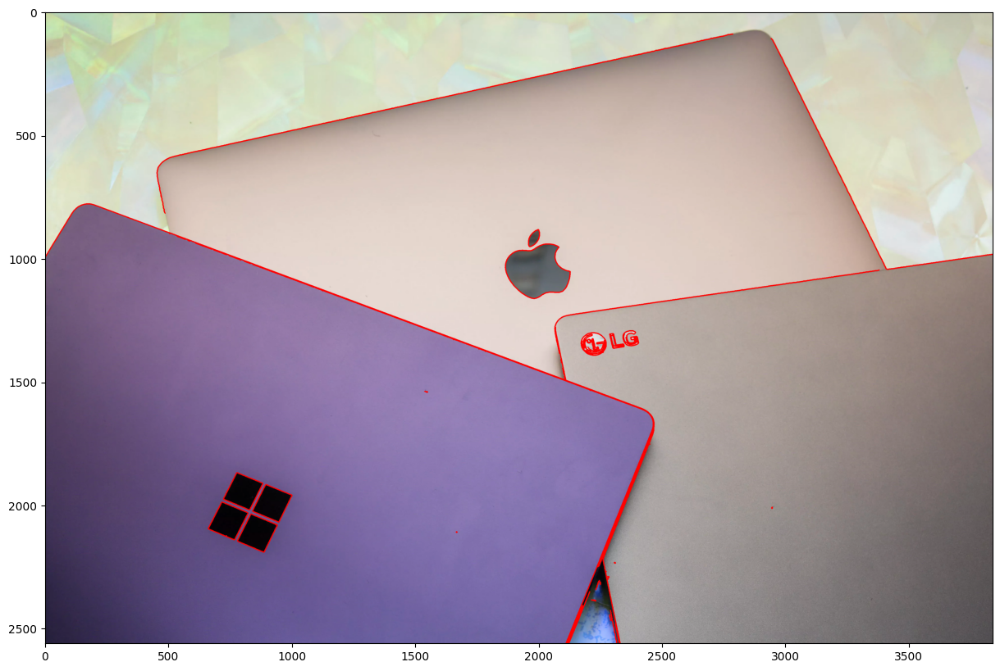

In [ ]:
# Path gambar laptop
img_laptop = '/content/drive/MyDrive/PCVK/Images/Images/Object Detection/laptop.jpg'

img = cv.imread(img_laptop)
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# Convert the image to grayscale
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# Apply edge detection
edges = cv.Canny(gray, 60, 210, apertureSize=3)

# Find contours
contours, hierarchy = cv.findContours(edges, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)

# Draw contours
cv.drawContours(img, contours, -1, (255, 0, 0), 3)

# Display the input image with the detected contours
plt.figure(figsize=(20,10))
plt.imshow(img)

## D2. Praktikum Feature Matching dan Face Detection

### 1. Lakukan Face Detection untuk image object lain yang tersedia pada (/images/facedet). Tampilkan seperti pada contoh berikut.

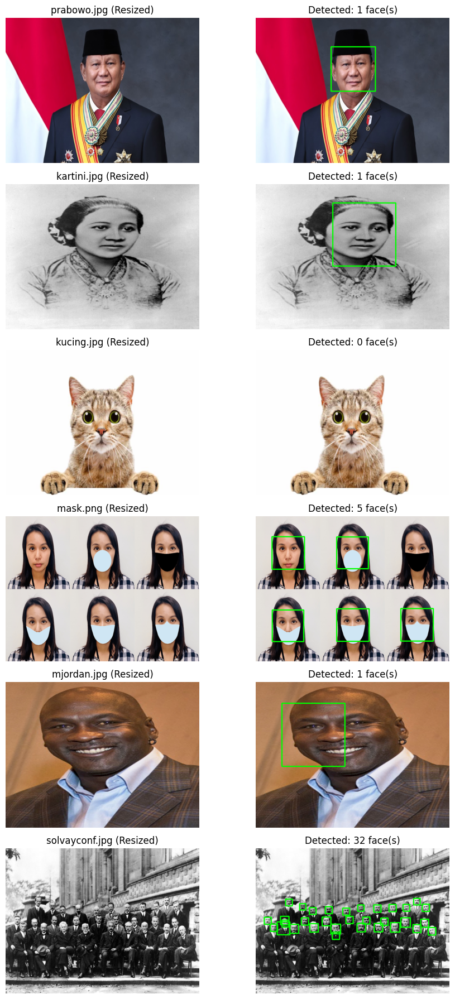

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Konfigurasi
FOLDER_PATH = '/content/drive/MyDrive/PCVK/Images/Images/facedet'
TARGET_SIZE = (800, 600)  # (width, height) untuk resize

# Load cascade classifiers
cdir = cv2.data.haarcascades
face_cascade = cv2.CascadeClassifier(cdir + "haarcascade_frontalface_default.xml")
eye_cascade = cv2.CascadeClassifier(cdir + "haarcascade_eye.xml")

# ===== KONFIGURASI PARAMETER DETEKSI PER FOTO =====
IMAGE_CONFIGS = {
    "prabowo.jpg": {
        'scaleFactor': 1.1,
        'minNeighbors': 3,
        'minSize': (80, 80),
        'require_eyes': False,
        'single_face': True
    },
    "kartini.jpg": {
        'scaleFactor': 1.1,
        'minNeighbors': 3,
        'minSize': (80, 80),
        'require_eyes': False,
        'single_face': True
    },
    "kucing.jpg": {
        'scaleFactor': 1.1,
        'minNeighbors': 3,
        'minSize': (60, 60),
        'require_eyes': False,
        'single_face': True
    },
    "mask.png": {
        'scaleFactor': 1.1,
        'minNeighbors': 5,  # Lebih ketat
        'minSize': (50, 50),
        'require_eyes': True,  # Harus ada mata untuk filter masker hitam
        'single_face': False
    },
    "mjordan.jpg": {
        'scaleFactor': 1.1,
        'minNeighbors': 2,
        'minSize': (100, 100),
        'require_eyes': False,
        'single_face': True
    },
    "solvayconf.jpg": {
        'scaleFactor': 1.05,
        'minNeighbors': 3,
        'minSize': (20, 20),
        'require_eyes': False,
        'single_face': False
    }
}

# Default config untuk file yang tidak ada di list
DEFAULT_CONFIG = {
    'scaleFactor': 1.1,
    'minNeighbors': 4,
    'minSize': (50, 50),
    'require_eyes': False,
    'single_face': False
}


def preprocess_image(img):
    """Resize dan preprocessing gambar"""
    img_resized = cv2.resize(img, TARGET_SIZE, interpolation=cv2.INTER_AREA)
    gray = cv2.cvtColor(img_resized, cv2.COLOR_BGR2GRAY)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    gray = clahe.apply(gray)
    return img_resized, gray


def get_image_config(fname):
    """Dapatkan konfigurasi untuk file tertentu"""
    return IMAGE_CONFIGS.get(fname, DEFAULT_CONFIG)


def detect_faces(gray, config):
    """Deteksi wajah dengan parameter dari config"""
    faces = face_cascade.detectMultiScale(
        gray,
        scaleFactor=config['scaleFactor'],
        minNeighbors=config['minNeighbors'],
        minSize=config['minSize'],
        flags=cv2.CASCADE_SCALE_IMAGE
    )

    # Untuk foto yang sulit, coba dengan histogram equalization
    if len(faces) == 0 and config['single_face']:
        gray_eq = cv2.equalizeHist(gray)
        faces = face_cascade.detectMultiScale(
            gray_eq,
            scaleFactor=config['scaleFactor'],
            minNeighbors=config['minNeighbors'],
            minSize=config['minSize'],
            flags=cv2.CASCADE_SCALE_IMAGE
        )

    return faces


def validate_face(gray, x, y, w, h, config):
    """Validasi apakah deteksi adalah wajah yang valid"""
    img_height, img_width = gray.shape[:2]

    # Filter ukuran minimum
    if w < 15 or h < 15:
        return False

    # Filter aspect ratio (harus berbentuk wajah)
    aspect_ratio = w / float(h)
    if aspect_ratio < 0.5 or aspect_ratio > 2.0:
        return False

    # Filter posisi Y: wajah tidak boleh terlalu bawah
    # Kecuali untuk foto grup (multiple faces)
    if config['single_face']:
        # Untuk single face, wajah harus di 70% atas gambar
        if y > img_height * 0.7:
            return False
        # Wajah harus cukup besar (hindari kancing/detail kecil)
        if w < 60 or h < 60:
            return False

    # Jika require_eyes = True, WAJIB ada mata dengan validasi ketat
    if config['require_eyes']:
        roi_gray = gray[y:y+h, x:x+w]
        eyes = eye_cascade.detectMultiScale(
            roi_gray,
            scaleFactor=1.1,
            minNeighbors=5,  # Lebih ketat untuk filter masker hitam
            minSize=(int(w*0.15), int(h*0.15))
        )
        if len(eyes) < 2:  # Harus ada minimal 2 mata
            return False

    # Validasi mata permisif (optional check untuk foto lainnya)
    else:
        roi_gray = gray[y:y+h, x:x+w]
        eyes = eye_cascade.detectMultiScale(
            roi_gray,
            scaleFactor=1.2,
            minNeighbors=1,
            minSize=(int(w*0.08), int(h*0.08))
        )

        # Untuk single face: validasi lebih ketat
        if config['single_face']:
            # Harus punya mata ATAU ukuran sangat besar
            if len(eyes) == 0 and (w < 150 or h < 150):
                return False
            # Posisi center wajah harus di bagian atas-tengah gambar
            center_y = y + h/2
            if center_y > img_height * 0.6:
                return False
        # Untuk multiple faces (foto grup), sangat permisif
        # Biarkan lolos meskipun tidak ada mata terdeteksi

    return True


def filter_faces(gray, faces, config):
    """Filter dan validasi semua wajah yang terdeteksi"""
    valid_faces = []

    for (x, y, w, h) in faces:
        if validate_face(gray, x, y, w, h, config):
            valid_faces.append((x, y, w, h))

    return valid_faces


def process_image(img_path, fname):
    """Proses satu gambar: preprocessing, deteksi, dan visualisasi"""
    # Baca gambar
    img = cv2.imread(img_path)
    if img is None:
        raise ValueError(f"Tidak bisa membaca: {img_path}")

    # Preprocessing
    img_resized, gray = preprocess_image(img)

    # Dapatkan konfigurasi untuk file ini
    config = get_image_config(fname)

    # Deteksi wajah dengan parameter dari config
    faces = detect_faces(gray, config)

    # Filter dan validasi wajah
    faces = filter_faces(gray, faces, config)

    # Ambil wajah terbesar jika single_face = True
    if config['single_face'] and len(faces) > 1:
        faces = [max(faces, key=lambda f: f[2] * f[3])]

    # Gambar kotak pada wajah
    img_result = img_resized.copy()
    for (x, y, w, h) in faces:
        cv2.rectangle(img_result, (x, y), (x+w, y+h), (0, 255, 0), 3)

    return img_resized, img_result, len(faces)


# Visualisasi hasil
target_files = list(IMAGE_CONFIGS.keys())
n = len(target_files)
fig, axes = plt.subplots(n, 2, figsize=(10, 3*n))

for i, fname in enumerate(target_files):
    img_path = os.path.join(FOLDER_PATH, fname)

    try:
        img_original, img_detected, num_faces = process_image(img_path, fname)

        # Kolom kiri: gambar original (sudah di-resize)
        axes[i, 0].imshow(cv2.cvtColor(img_original, cv2.COLOR_BGR2RGB))
        axes[i, 0].set_title(f"{fname} (Resized)")
        axes[i, 0].axis('off')

        # Kolom kanan: hasil deteksi
        axes[i, 1].imshow(cv2.cvtColor(img_detected, cv2.COLOR_BGR2RGB))
        axes[i, 1].set_title(f"Detected: {num_faces} face(s)")
        axes[i, 1].axis('off')

    except Exception as e:
        print(f"Error processing {fname}: {e}")

plt.tight_layout()
plt.show()

### 2. Pada Soal No.2. wajah kucing tidak bisa dideteksi dengan baik. Lakukan deteksi wajah kucing hingga muncul rectangle pada bagian wajahnya. Petunjuk pada soal ini, perhatikan pretrained features yang telah disediakan OpenCV. Gunakan xml yang ada jika memang telah disediakan. Jika belum ada, coba cari dengan searching melalui search engines.

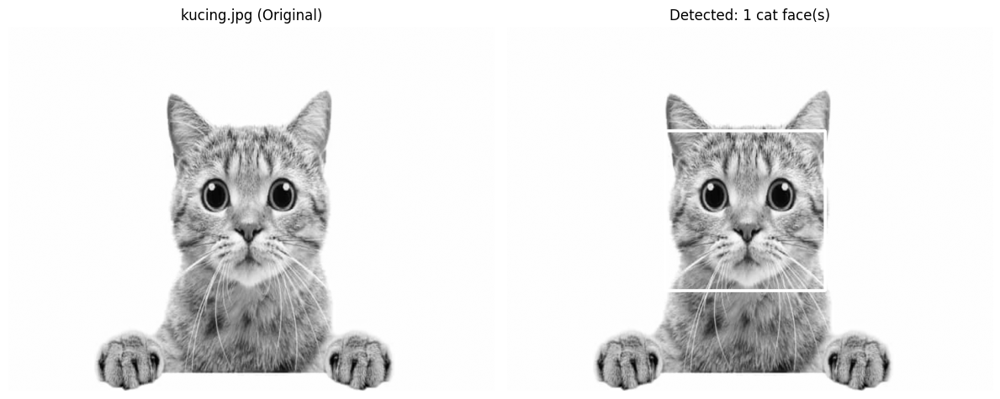

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import urllib.request

# Konfigurasi
FOLDER_PATH = '/content/drive/MyDrive/PCVK/Images/Images/facedet'
CAT_IMAGE = "kucing.jpg"
TARGET_SIZE = (800, 600)

# Download Haar Cascade untuk deteksi wajah kucing
CAT_CASCADE_URL = "https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_frontalcatface.xml"
CAT_CASCADE_PATH = "/tmp/haarcascade_frontalcatface.xml"

# Download jika belum ada
if not os.path.exists(CAT_CASCADE_PATH):
    print("Downloading cat face cascade...")
    urllib.request.urlretrieve(CAT_CASCADE_URL, CAT_CASCADE_PATH)
    print("Download complete!")

# Load cascade classifier untuk kucing
cat_cascade = cv2.CascadeClassifier(CAT_CASCADE_PATH)

def detect_cat_face(img_path):
    """Deteksi wajah kucing"""
    img = cv2.imread(img_path)
    if img is None:
        raise ValueError(f"Tidak bisa membaca: {img_path}")

    # Resize gambar
    img_resized = cv2.resize(img, TARGET_SIZE, interpolation=cv2.INTER_AREA)

    # Convert ke grayscale
    gray = cv2.cvtColor(img_resized, cv2.COLOR_BGR2GRAY)

    # Deteksi wajah kucing dengan parameter awal
    cat_faces = cat_cascade.detectMultiScale(
        gray,
        scaleFactor=1.05,
        minNeighbors=9,
        minSize=(100, 100)
    )

    # Jika tidak terdeteksi, coba parameter lebih sensitif
    if len(cat_faces) == 0:
        cat_faces = cat_cascade.detectMultiScale(
            gray,
            scaleFactor=1.8,
            minNeighbors=7,
            minSize=(40, 40)
        )

    # Gambar rectangle pada wajah kucing (di grayscale)
    img_result = gray.copy()
    for (x, y, w, h) in cat_faces:
        cv2.rectangle(img_result, (x, y), (x+w, y+h), (255, 255, 255), 3)

    return gray, img_result, len(cat_faces)

# Proses gambar kucing
img_path = os.path.join(FOLDER_PATH, CAT_IMAGE)

try:
    img_original, img_detected, num_faces = detect_cat_face(img_path)

    # Visualisasi hasil (grayscale)
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))

    axes[0].imshow(img_original, cmap="gray")
    axes[0].set_title(f"{CAT_IMAGE} (Original)")
    axes[0].axis('off')

    axes[1].imshow(img_detected, cmap="gray")
    axes[1].set_title(f"Detected: {num_faces} cat face(s)")
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()

except Exception as e:
    print(f"Error: {e}")

### 3. Cobakan juga untuk eyes detection pada wajah Pak Prabowo:


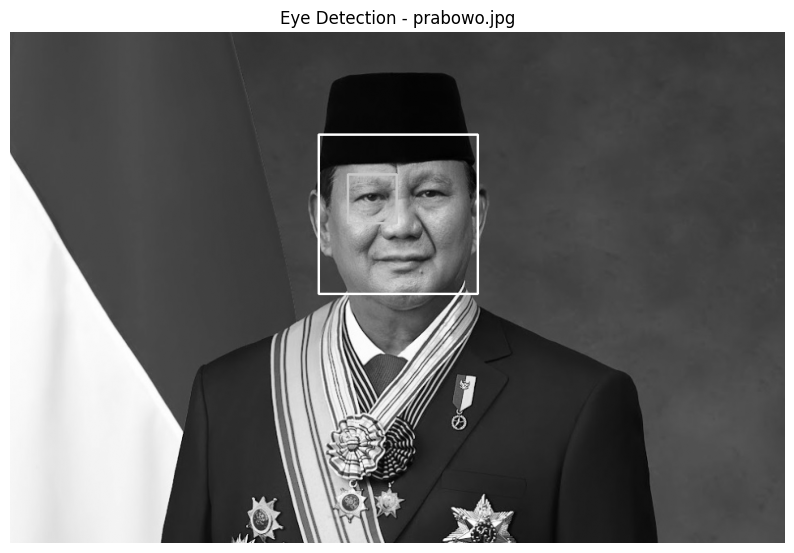

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt

# Konfigurasi
FOLDER_PATH = '/content/drive/MyDrive/PCVK/Images/Images/facedet'
IMAGE_FILE = "prabowo.jpg"

# Load cascade classifiers
cdir = cv2.data.haarcascades
face_cascade = cv2.CascadeClassifier(cdir + "haarcascade_frontalface_default.xml")
eye_cascade = cv2.CascadeClassifier(cdir + "haarcascade_eye.xml")

# Baca gambar
img_path = os.path.join(FOLDER_PATH, IMAGE_FILE)
img = cv2.imread(img_path)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Deteksi wajah
faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5, minSize=(100, 100))

# Hitung total mata
total_eyes = 0

# Deteksi mata pada setiap wajah
for (x, y, w, h) in faces:
    # Gambar rectangle pada wajah
    cv2.rectangle(gray, (x, y), (x+w, y+h), (255, 255, 255), 2)

    # ROI untuk deteksi mata
    roi_gray = gray[y:y+h, x:x+w]

    # Deteksi mata
    eyes = eye_cascade.detectMultiScale(roi_gray, scaleFactor=1.1, minNeighbors=5, minSize=(20, 20))
    total_eyes += len(eyes)

    # Gambar rectangle pada mata
    for (ex, ey, ew, eh) in eyes:
        cv2.rectangle(roi_gray, (ex, ey), (ex+ew, ey+eh), (200, 200, 200), 2)

# Tampilkan hasil
plt.figure(figsize=(10, 8))
plt.imshow(gray, cmap='gray')
plt.title(f'Eye Detection - {IMAGE_FILE}')
plt.axis('off')
plt.show()

### 4. Lakukan deteksi senyuman pada gambar people:

Detected 9 face(s)
Face 1: Not Smiling (0 smile(s) detected)
Face 2: Not Smiling (0 smile(s) detected)
Face 3: Not Smiling (0 smile(s) detected)
Face 4: Not Smiling (0 smile(s) detected)
Face 5: Smiling (1 smile(s) detected)
Face 6: Smiling (1 smile(s) detected)
Face 7: Not Smiling (0 smile(s) detected)
Face 8: Not Smiling (0 smile(s) detected)
Face 9: Not Smiling (0 smile(s) detected)


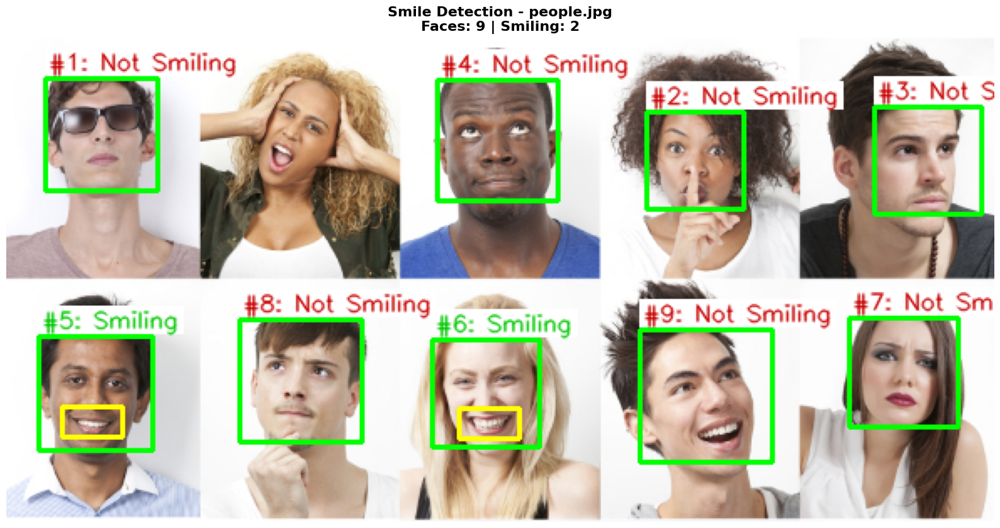

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt

# Configuration
FOLDER_PATH = '/content/drive/MyDrive/PCVK/Images/Images/facedet'
CASCADE_PATH = '/content/drive/MyDrive/PCVK/Images/Images/haarcascades'
IMAGE_FILE = "people.jpg"

# Load cascade classifiers
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + "haarcascade_frontalface_default.xml")
smile_cascade = cv2.CascadeClassifier(os.path.join(CASCADE_PATH, "haarcascade_smile.xml"))

# Verify cascade loaded successfully
if smile_cascade.empty():
    print("Error: Could not load smile cascade classifier!")
    print(f"Path checked: {os.path.join(CASCADE_PATH, 'haarcascade_smile.xml')}")
    exit()

# Read image
img_path = os.path.join(FOLDER_PATH, IMAGE_FILE)
img = cv2.imread(img_path)

if img is None:
    print(f"Error: Could not load image from {img_path}")
    exit()

# Convert BGR to RGB for matplotlib
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Convert to grayscale for detection only
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Detect faces
faces = face_cascade.detectMultiScale(
    gray,
    scaleFactor=1.1,
    minNeighbors=5,
    minSize=(50, 50)
)

print(f"Detected {len(faces)} face(s)")

# Create copy for drawing (color)
img_result = img_rgb.copy()

# Initialize counters
total_smiles = 0
face_results = []

# Detect smiles in each face
for i, (x, y, w, h) in enumerate(faces):
    # Draw face rectangle (green)
    cv2.rectangle(img_result, (x, y), (x+w, y+h), (0, 255, 0), 2)

    # ROI untuk deteksi senyuman - fokus pada area bawah wajah (50-95% dari atas)
    smile_region_y = y + int(h * 0.5)
    smile_region_h = int(h * 0.5)

    roi_gray = gray[smile_region_y:smile_region_y+smile_region_h, x:x+w]

    # Detect smiles with more sensitive parameters
    smiles = smile_cascade.detectMultiScale(
        roi_gray,
        scaleFactor=1.3,
        minNeighbors=8,
        minSize=(int(w * 0.2), int(h * 0.08)),
        maxSize=(int(w * 0.95), int(h * 0.5))
    )

    # Filter and select best smile detection
    filtered_smiles = []
    if len(smiles) > 0:
        # Sort by vertical position (lower in face = more likely to be mouth)
        # and by size
        smiles_scored = []
        for (sx, sy, sw, sh) in smiles:
            # Score based on position (prefer lower) and size
            position_score = sy  # Lower is better
            size_score = sw * sh
            total_score = position_score + (size_score / 100)
            smiles_scored.append((sx, sy, sw, sh, total_score))

        # Sort by score (higher is better for position, larger for size)
        smiles_scored.sort(key=lambda s: s[4], reverse=True)

        # Take the best detection
        sx, sy, sw, sh, _ = smiles_scored[0]
        abs_sx = x + sx
        abs_sy = smile_region_y + sy
        filtered_smiles.append((abs_sx, abs_sy, sw, sh))

    total_smiles += len(filtered_smiles)

    # Store results
    face_results.append({
        'face_id': i + 1,
        'position': (x, y, w, h),
        'smiling': len(filtered_smiles) > 0,
        'smile_count': len(filtered_smiles)
    })

    # Draw smile rectangles (yellow)
    for (sx, sy, sw, sh) in filtered_smiles:
        cv2.rectangle(img_result, (sx, sy), (sx+sw, sy+sh), (255, 255, 0), 2)

    # Add label with background for better readability
    status = "Smiling" if len(filtered_smiles) > 0 else "Not Smiling"
    label_color = (0, 200, 0) if len(filtered_smiles) > 0 else (200, 0, 0)
    label_text = f"#{i+1}: {status}"

    # Calculate text size for background
    font = cv2.FONT_HERSHEY_SIMPLEX
    font_scale = 0.45
    thickness = 1
    (text_width, text_height), baseline = cv2.getTextSize(label_text, font, font_scale, thickness)

    # Draw background rectangle
    bg_color = (255, 255, 255)
    cv2.rectangle(img_result,
                  (x, y - text_height - 8),
                  (x + text_width + 4, y - 2),
                  bg_color, -1)

    # Draw text
    cv2.putText(img_result, label_text,
                (x + 2, y - 5), font,
                font_scale, label_color, thickness, cv2.LINE_AA)

    print(f"Face {i+1}: {status} ({len(filtered_smiles)} smile(s) detected)")

# Visualization
plt.figure(figsize=(16, 12))
plt.imshow(img_result)
plt.title(f'Smile Detection - {IMAGE_FILE}\nFaces: {len(faces)} | Smiling: {total_smiles}',
          fontsize=16, fontweight='bold')
plt.axis('off')
plt.tight_layout()
plt.show()

### 5. Lakukan Face Tracking menggunakan Google Colab. Petunjuk, Tutorial
selengkapnya tentang akses kamera dan FaceDetection pada google colab dapat
dilihat di link berikut: https://www.youtube.com/watch?v=YjWh7QvVH60

In [ ]:
# import dependencies
from IPython.display import display, Javascript, Image
from google.colab.output import eval_js
from base64 import b64decode, b64encode
import cv2
import numpy as np
import PIL
import io
import html
import time

# function to convert the JavaScript object into an OpenCV image
def js_to_image(js_reply):
  """
  Params:
          js_reply: JavaScript object containing image from webcam
  Returns:
          img: OpenCV BGR image
  """
  # decode base64 image
  image_bytes = b64decode(js_reply.split(',')[1])
  # convert bytes to numpy array
  jpg_as_np = np.frombuffer(image_bytes, dtype=np.uint8)
  # decode numpy array into OpenCV BGR image
  img = cv2.imdecode(jpg_as_np, flags=1)

  return img

# function to convert OpenCV Rectangle bounding box image into base64 byte string to be overlayed on video stream
def bbox_to_bytes(bbox_array):
  """
  Params:
          bbox_array: Numpy array (pixels) containing rectangle to overlay on video stream.
  Returns:
        bytes: Base64 image byte string
  """
  # convert array into PIL image
  bbox_PIL = PIL.Image.fromarray(bbox_array, 'RGBA')
  iobuf = io.BytesIO()
  # format bbox into png for return
  bbox_PIL.save(iobuf, format='png')
  # format return string
  bbox_bytes = 'data:image/png;base64,{}'.format((str(b64encode(iobuf.getvalue()), 'utf-8')))

  return bbox_bytes


Haar Cascade Classifier
For this tutorial we will run a simple object detection algorithm called Haar Cascade on our images and video fetched from our webcam. OpenCV has a pre-trained Haar Cascade face detection model.

In [ ]:
# initialize the Haar Cascade face detection model
face_cascade = cv2.CascadeClassifier(cv2.samples.findFile(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml'))

Webcam Images
Running code on images taken from webcam is fairly straight-forward. We will utilize code within Google Colab's Code Snippets that has a variety of useful code functions to perform various tasks.

We will be using the code snippet for Camera Capture to utilize your computer's webcam.

In [ ]:
# Webcam Images
def take_photo(filename='photo.jpg', quality=0.8):
  js = Javascript('''
    async function takePhoto(quality) {
      const div = document.createElement('div');
      const capture = document.createElement('button');
      capture.textContent = 'Capture';
      div.appendChild(capture);

      const video = document.createElement('video');
      video.style.display = 'block';
      const stream = await navigator.mediaDevices.getUserMedia({video: true});

      document.body.appendChild(div);
      div.appendChild(video);
      video.srcObject = stream;
      await video.play();

      // Resize the output to fit the video element.
      google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

      // Wait for Capture to be clicked.
      await new Promise((resolve) => capture.onclick = resolve);

      const canvas = document.createElement('canvas');
      canvas.width = video.videoWidth;
      canvas.height = video.videoHeight;
      canvas.getContext('2d').drawImage(video, 0, 0);
      stream.getVideoTracks()[0].stop();
      div.remove();
      return canvas.toDataURL('image/jpeg', quality);
    }
    ''')
  display(js)

  # get photo data
  data = eval_js('takePhoto({})'.format(quality))
  # get OpenCV format image
  img = js_to_image(data)
  # grayscale img
  gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
  print(gray.shape)
  # get face bounding box coordinates using Haar Cascade
  faces = face_cascade.detectMultiScale(gray)
  # draw face bounding box on image
  for (x,y,w,h) in faces:
      img = cv2.rectangle(img,(x,y),(x+w,y+h),(255,0,0),2)
  # save image
  cv2.imwrite(filename, img)

  return filename

<IPython.core.display.Javascript object>

(480, 640)
Saved to photo.jpg


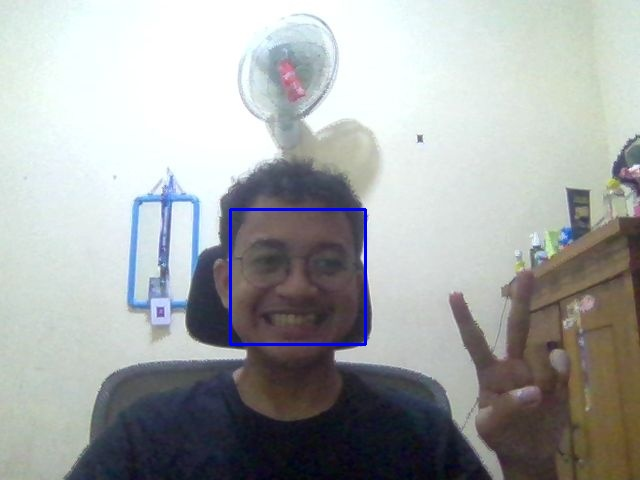

In [ ]:
try:
  filename = take_photo('photo.jpg')
  print('Saved to {}'.format(filename))

  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

Webcam Videos
Running code on webcam video is a little more complex than images. We need to start a video stream using our webcam as input. Then we run each frame through our progam (face detection) and create an overlay image that contains bounding box of detection(s). We then overlay the bounding box image back onto the next frame of our video stream.

In [ ]:
# JavaScript to properly create our live video stream using our webcam as input
def video_stream():
  js = Javascript('''
    var video;
    var div = null;
    var stream;
    var captureCanvas;
    var imgElement;
    var labelElement;

    var pendingResolve = null;
    var shutdown = false;

    function removeDom() {
       stream.getVideoTracks()[0].stop();
       video.remove();
       div.remove();
       video = null;
       div = null;
       stream = null;
       imgElement = null;
       captureCanvas = null;
       labelElement = null;
    }

    function onAnimationFrame() {
      if (!shutdown) {
        window.requestAnimationFrame(onAnimationFrame);
      }
      if (pendingResolve) {
        var result = "";
        if (!shutdown) {
          captureCanvas.getContext('2d').drawImage(video, 0, 0, 640, 480);
          result = captureCanvas.toDataURL('image/jpeg', 0.8)
        }
        var lp = pendingResolve;
        pendingResolve = null;
        lp(result);
      }
    }

    async function createDom() {
      if (div !== null) {
        return stream;
      }

      div = document.createElement('div');
      div.style.border = '2px solid black';
      div.style.padding = '3px';
      div.style.width = '100%';
      div.style.maxWidth = '600px';
      document.body.appendChild(div);

      const modelOut = document.createElement('div');
      modelOut.innerHTML = "<span>Status:</span>";
      labelElement = document.createElement('span');
      labelElement.innerText = 'No data';
      labelElement.style.fontWeight = 'bold';
      modelOut.appendChild(labelElement);
      div.appendChild(modelOut);

      video = document.createElement('video');
      video.style.display = 'block';
      video.width = div.clientWidth - 6;
      video.setAttribute('playsinline', '');
      video.onclick = () => { shutdown = true; };
      stream = await navigator.mediaDevices.getUserMedia(
          {video: { facingMode: "environment"}});
      div.appendChild(video);

      imgElement = document.createElement('img');
      imgElement.style.position = 'absolute';
      imgElement.style.zIndex = 1;
      imgElement.onclick = () => { shutdown = true; };
      div.appendChild(imgElement);

      const instruction = document.createElement('div');
      instruction.innerHTML =
          '<span style="color: red; font-weight: bold;">' +
          'When finished, click here or on the video to stop this demo</span>';
      div.appendChild(instruction);
      instruction.onclick = () => { shutdown = true; };

      video.srcObject = stream;
      await video.play();

      captureCanvas = document.createElement('canvas');
      captureCanvas.width = 640; //video.videoWidth;
      captureCanvas.height = 480; //video.videoHeight;
      window.requestAnimationFrame(onAnimationFrame);

      return stream;
    }
    async function stream_frame(label, imgData) {
      if (shutdown) {
        removeDom();
        shutdown = false;
        return '';
      }

      var preCreate = Date.now();
      stream = await createDom();

      var preShow = Date.now();
      if (label != "") {
        labelElement.innerHTML = label;
      }

      if (imgData != "") {
        var videoRect = video.getClientRects()[0];
        imgElement.style.top = videoRect.top + "px";
        imgElement.style.left = videoRect.left + "px";
        imgElement.style.width = videoRect.width + "px";
        imgElement.style.height = videoRect.height + "px";
        imgElement.src = imgData;
      }

      var preCapture = Date.now();
      var result = await new Promise(function(resolve, reject) {
        pendingResolve = resolve;
      });
      shutdown = false;

      return {'create': preShow - preCreate,
              'show': preCapture - preShow,
              'capture': Date.now() - preCapture,
              'img': result};
    }
    ''')

  display(js)

def video_frame(label, bbox):
  data = eval_js('stream_frame("{}", "{}")'.format(label, bbox))
  return data

In [ ]:
# start streaming video from webcam
video_stream()
# label for video
label_html = 'Capturing...'
# initialze bounding box to empty
bbox = ''
count = 0
while True:
    js_reply = video_frame(label_html, bbox)
    if not js_reply:
        break

    # convert JS response to OpenCV Image
    img = js_to_image(js_reply["img"])

    # create transparent overlay for bounding box
    bbox_array = np.zeros([480,640,4], dtype=np.uint8)

    # grayscale image for face detection
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # get face region coordinates
    faces = face_cascade.detectMultiScale(gray)
    # get face bounding box for overlay
    for (x,y,w,h) in faces:
      bbox_array = cv2.rectangle(bbox_array,(x,y),(x+w,y+h),(255,0,0),2)

    bbox_array[:,:,3] = (bbox_array.max(axis = 2) > 0 ).astype(int) * 255
    # convert overlay of bbox into bytes
    bbox_bytes = bbox_to_bytes(bbox_array)
    # update bbox so next frame gets new overlay
    bbox = bbox_bytes

<IPython.core.display.Javascript object>

/tmp/ipython-input-3296070078.py:38: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  bbox_PIL = PIL.Image.fromarray(bbox_array, 'RGBA')


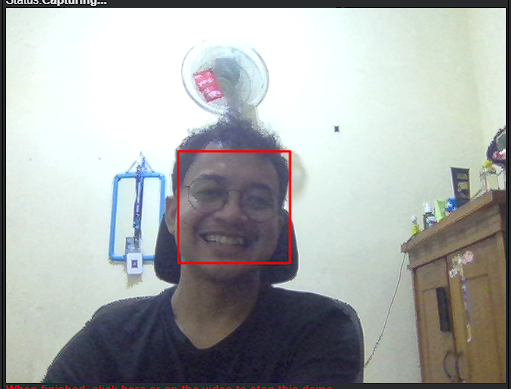

### 6. Lakukan Blurring pada bagian wajah yang terdeteksi. Berikut contoh keluarannya. Petunjuk: anda dapat menggunakan cv.medianBlur untuk melakukan Blurring

In [ ]:
video_stream()
label_html = 'Detecting & Blurring Faces...'
bbox = ''

while True:
    js_reply = video_frame(label_html, bbox)
    if not js_reply:
        break

    # Ambil frame dari kamera
    img = js_to_image(js_reply["img"])
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    faces = face_cascade.detectMultiScale(gray, 1.1, 5)

    # Blur area wajah
    for (x, y, w, h) in faces:
        roi = img[y:y+h, x:x+w]
        if roi.size > 0:
            roi_blur = cv2.medianBlur(roi, 45)
            img[y:y+h, x:x+w] = roi_blur

        # Kotak wajah (opsional)
        cv2.rectangle(img, (x, y), (x+w, y+h), (255, 0, 0), 2)

    # 💡 Konversi hasil blur ke format stream TANPA overlay
    _, buffer = cv2.imencode('.jpg', cv2.cvtColor(img, cv2.COLOR_RGB2BGR))
    bbox = 'data:image/jpeg;base64,' + b64encode(buffer).decode()

<IPython.core.display.Javascript object>

KeyboardInterrupt: 

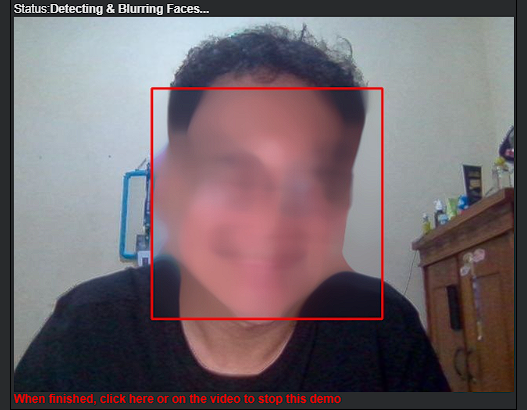

### 7. Mengolah gambar KTM masing-masing

#### a. Gambar KTM

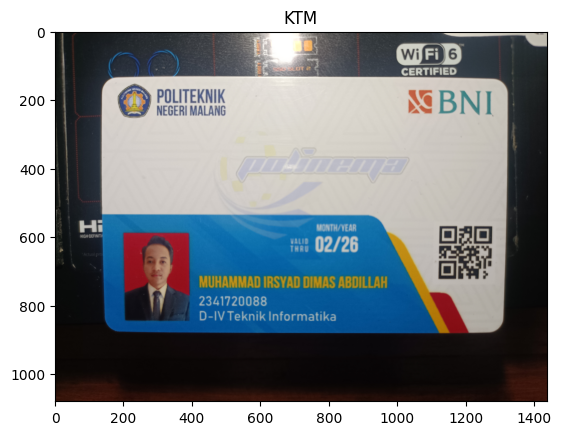

In [ ]:
import cv2
import matplotlib.pyplot as plt

def resize_with_ratio(img, target_width=None, target_height=None):
    """
    Resize gambar dengan menjaga aspect ratio.
    - target_width: lebar yang diinginkan (px)
    - target_height: tinggi yang diinginkan (px)
    Salah satu boleh None, nanti dihitung otomatis.
    """
    h, w = img.shape[:2]
    if target_width is not None and target_height is None:
        ratio = target_width / w
        new_size = (target_width, int(h * ratio))
    elif target_height is not None and target_width is None:
        ratio = target_height / h
        new_size = (int(w * ratio), target_height)
    else:
        raise ValueError("Isi salah satu: target_width atau target_height")

    resized = cv2.resize(img, new_size, interpolation=cv2.INTER_AREA)
    return resized

# --- Contoh penggunaan ---
ktm_path = "/content/drive/MyDrive/PCVK/Images/KTM/KTM NEW/IMG_20251103_230126.jpg"
img = cv2.imread(ktm_path)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

resized_img = resize_with_ratio(img_rgb, target_height=1080)

plt.imshow(resized_img)
plt.title("KTM")
plt.show()

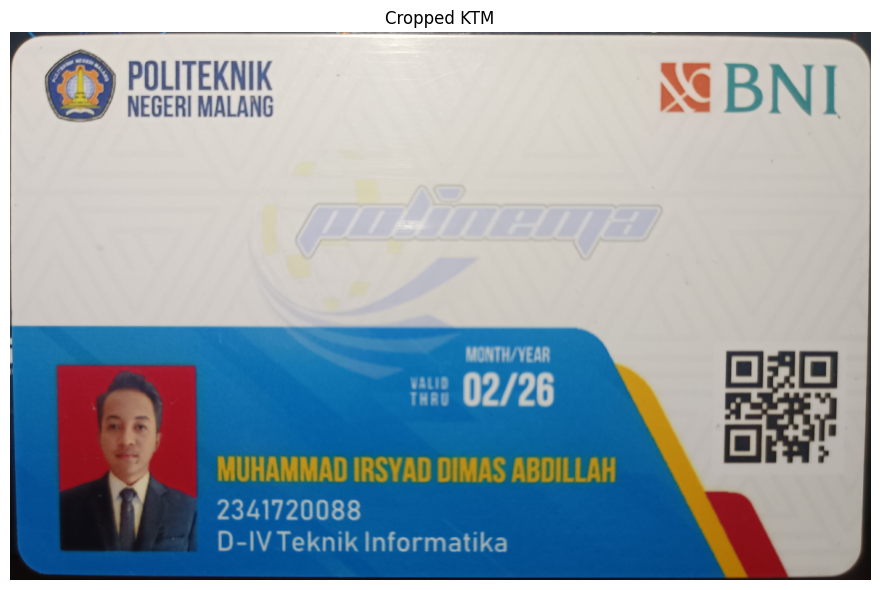

Ukuran crop: (755, 1186, 3)
Hasil crop disimpan ke: cropped_ktm.png


In [ ]:
def crop_card_manual(img, top=95, bottom=150, left=85, right=85):
    """
    Crop manual berdasarkan offset dari tepi gambar.
    """
    h, w = img.shape[:2]
    cropped = img[top:h-bottom, left:w-right]
    return cropped

# Crop manual dengan koordinat yang lebih presisi
cropped = crop_card_manual(resized_img, top=130, bottom=195, left=135, right=117)

# Tampilkan hasil
plt.figure(figsize=(12, 6))
plt.imshow(cropped)
plt.title("Cropped KTM")
plt.axis('off')
plt.tight_layout()
plt.show()

print(f"Ukuran crop: {cropped.shape}")

# ===================== SAVE HASIL =====================
import cv2

# Simpan hasil crop ke file
output_path = "cropped_ktm.png"
cv2.imwrite(output_path, cv2.cvtColor(cropped, cv2.COLOR_RGB2BGR))  # konversi ke BGR jika pakai matplotlib
print(f"Hasil crop disimpan ke: {output_path}")

#### b. Tampilkan Foto KTM seperti contoh berikut ini:

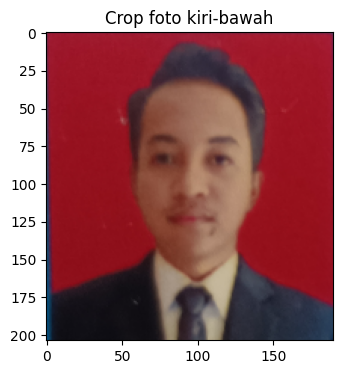

In [ ]:
h, w = cropped.shape[:2]

# Definisikan ROI foto secara relatif
x0 = 65
x1 = 255
y0 = int(0.61 * h)
y1 = int(0.88 * h)

photo_cropped = cropped[y0:y1, x0:x1]

# Tampilkan hasil
plt.figure(figsize=(4,4))
plt.imshow(photo_cropped)  # Langsung aja, sudah RGB
plt.title("Crop foto kiri-bawah")
plt.show()

#### c. Lakukan Deteksi Obyek KTM pada gambar yang berisi KTM dengan barang lainnya dengan menggunakan Konsep Feature Matching

Template foto: (755, 1186), Keypoints: 2000

Mendeteksi pada: IMG_20251103_230656.jpg
Scene size after resize: (1080, 1438)
Total matches: 745, Good matches: 40
Objek KTM terdeteksi.


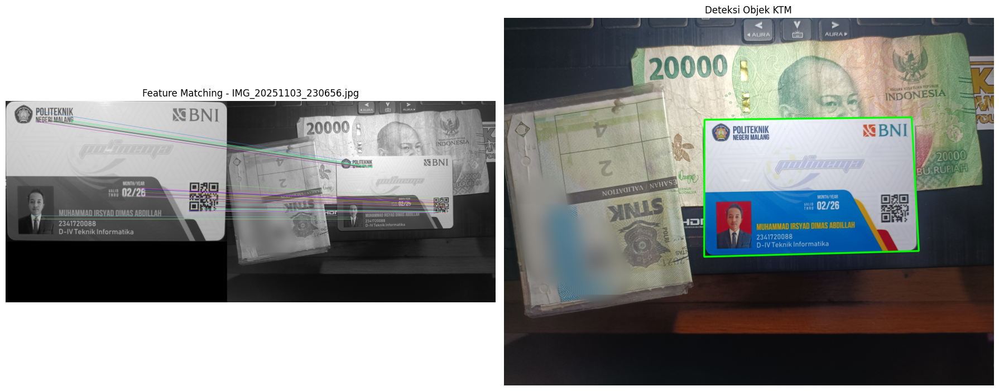


Mendeteksi pada: IMG_20251103_230617.jpg
Scene size after resize: (1080, 1437)
Total matches: 965, Good matches: 40
Objek KTM terdeteksi.


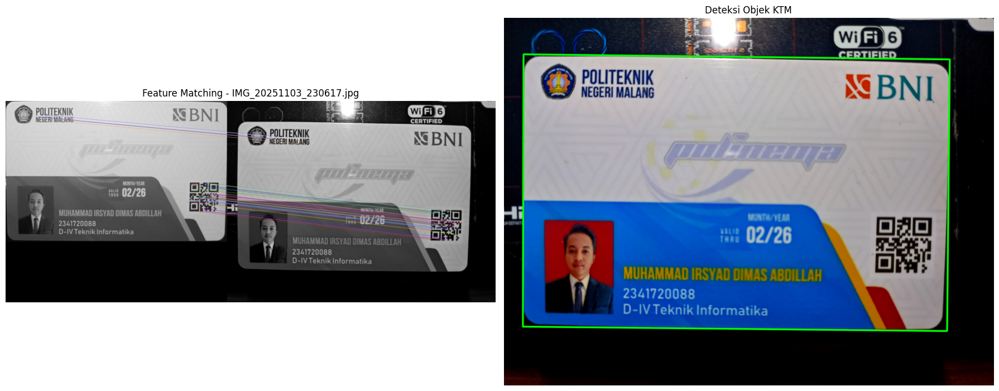


Mendeteksi pada: IMG_20251103_230416.jpg
Scene size after resize: (1080, 1438)
Total matches: 1008, Good matches: 40
Objek KTM terdeteksi.


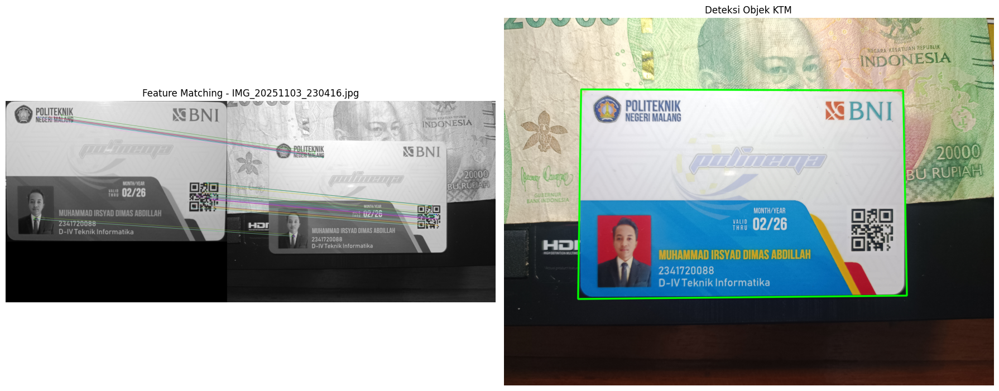


Mendeteksi pada: IMG_20251103_230149.jpg
Scene size after resize: (1080, 810)
Total matches: 821, Good matches: 40
Objek KTM terdeteksi.


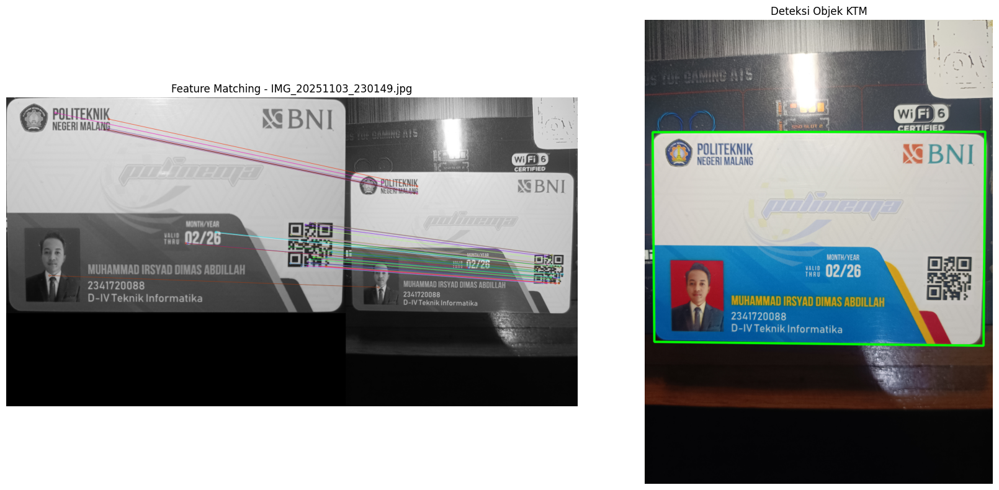


Mendeteksi pada: IMG_20251103_230605.jpg
Scene size after resize: (1080, 810)
Total matches: 714, Good matches: 40
Objek KTM terdeteksi.


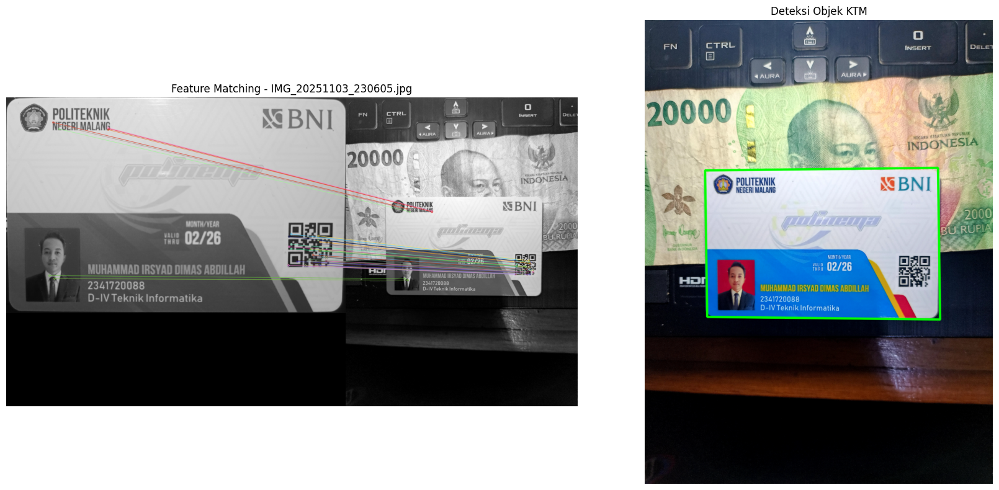


Mendeteksi pada: IMG_20251103_230126.jpg
Scene size after resize: (1080, 1438)
Total matches: 1244, Good matches: 40
Objek KTM terdeteksi.


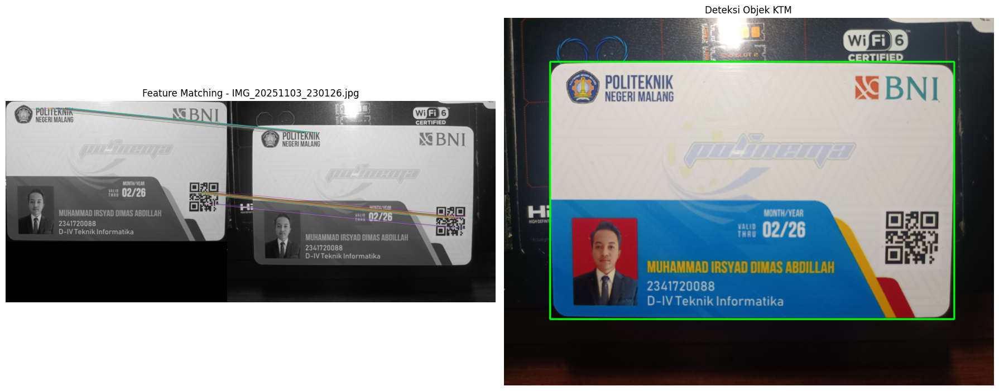

In [ ]:
import glob
import cv2
import numpy as np
import matplotlib.pyplot as plt

folder_path = "/content/drive/MyDrive/PCVK/Images/KTM/KTM NEW"

# Template (hasil crop dari langkah sebelumnya) - konversi ke grayscale
template_img = cv2.cvtColor(cropped, cv2.COLOR_RGB2GRAY)

# Buat ORB detector
orb = cv2.ORB_create(nfeatures=2000)

# Deteksi keypoint dan deskriptor untuk template
kp1, des1 = orb.detectAndCompute(template_img, None)

print(f"Template foto: {template_img.shape}, Keypoints: {len(kp1)}")

# Loop semua gambar di folder KTM
for scene_path in glob.glob(f"{folder_path}/*.jpg"):
    # Lewati jika gambar adalah template sendiri
    if "KTM_OHIM.png" in scene_path:
        continue

    print(f"\nMendeteksi pada: {scene_path.split('/')[-1]}")

    # Baca gambar scene
    scene_img_original = cv2.imread(scene_path)
    scene_img_rgb = cv2.cvtColor(scene_img_original, cv2.COLOR_BGR2RGB)

    # Resize dengan rasio yang sama
    scene_img_resized = resize_with_ratio(scene_img_rgb, target_height=1080)

    # Konversi ke grayscale untuk feature matching
    scene_img = cv2.cvtColor(scene_img_resized, cv2.COLOR_RGB2GRAY)

    print(f"Scene size after resize: {scene_img.shape}")

    # Deteksi keypoint dan deskriptor untuk scene
    kp2, des2 = orb.detectAndCompute(scene_img, None)

    if des2 is None or len(kp2) == 0:
        print("Tidak ada keypoint terdeteksi di scene.")
        continue

    # BFMatcher + crossCheck
    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
    matches = bf.match(des1, des2)
    matches = sorted(matches, key=lambda x: x.distance)

    # Ambil beberapa match terbaik
    good_matches = matches[:40]

    print(f"Total matches: {len(matches)}, Good matches: {len(good_matches)}")

    # Estimasi Homography (posisi KTM di scene)
    if len(good_matches) > 10:
        src_pts = np.float32([kp1[m.queryIdx].pt for m in good_matches]).reshape(-1,1,2)
        dst_pts = np.float32([kp2[m.trainIdx].pt for m in good_matches]).reshape(-1,1,2)

        # Gunakan RANSAC untuk estimasi homografi
        M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

        if M is not None:
            h, w = template_img.shape
            pts = np.float32([[0,0],[0,h],[w,h],[w,0]]).reshape(-1,1,2)
            dst = cv2.perspectiveTransform(pts, M)

            # Gambar kotak hasil deteksi di gambar RGB
            scene_img_color = scene_img_resized.copy()
            cv2.polylines(scene_img_color, [np.int32(dst)], True, (0,255,0), 3, cv2.LINE_AA)
            print("Objek KTM terdeteksi.")
        else:
            scene_img_color = scene_img_resized.copy()
            print("Homography gagal dihitung.")
    else:
        scene_img_color = scene_img_resized.copy()
        print("Match terlalu sedikit untuk estimasi posisi.")

    # Tampilkan hasil
    result = cv2.drawMatches(template_img, kp1, scene_img, kp2, good_matches, None, flags=2)

    fig, axes = plt.subplots(1, 2, figsize=(18, 8))

    # Matching result
    axes[0].imshow(result, cmap='gray')
    axes[0].set_title(f"Feature Matching - {scene_path.split('/')[-1]}")
    axes[0].axis('off')

    # Detection result
    axes[1].imshow(scene_img_color)
    axes[1].set_title("Deteksi Objek KTM")
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()

## Tambahan Tugas Praktikum:
Tampilkan karakter-karakter pada KTM ini Deep Learning untuk melakukan
pengenalan karakter. Sebelum melakukan training data, terlebih dahulu di
siapkan data yang akan dilakukan training yaitu data image nomor angka 0-9.
Untuk membuat data tersebut bisa gunakan image editor untuk dilakukan croping
satu persatu. Kemudian selanjutnya gunakan source code di bawah ini untuk
proses persiapan untuk training.

In [ ]:
!pip install tensorflow

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os
from pathlib import Path
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau, TensorBoard
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import warnings
warnings.filterwarnings('ignore')

print(f"TensorFlow Version: {tf.__version__}")
print(f"GPU Available: {tf.config.list_physical_devices('GPU')}")

TensorFlow Version: 2.19.0
GPU Available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [ ]:
# Paths
TRAIN_PATH = '/content/drive/MyDrive/PCVK/Images/KTM/KTM NEW/TRAIN ANGKA'
KTM_PATH = '/content/drive/MyDrive/PCVK/Images/KTM/KTM NEW'
MODEL_PATH = 'model_angka_ktm_best.keras'  # Changed from .h5 to .keras
LOG_DIR = 'logs'

# Hyperparameters
IMG_SIZE = (64, 64)
BATCH_SIZE = 32
EPOCHS = 50
LEARNING_RATE = 0.001
NUM_CLASSES = 10
VALIDATION_SPLIT = 0.2

# Create directories
os.makedirs(LOG_DIR, exist_ok=True)

print("Configuration loaded successfully!")
print(f"Image Size: {IMG_SIZE}")
print(f"Batch Size: {BATCH_SIZE}")
print(f"Epochs: {EPOCHS}")
print(f"Number of Classes: {NUM_CLASSES}")
print(f"Model will be saved as: {MODEL_PATH}")

Configuration loaded successfully!
Image Size: (64, 64)
Batch Size: 32
Epochs: 50
Number of Classes: 10
Model will be saved as: model_angka_ktm_best.keras


In [ ]:
def load_dataset(data_path):
    """
    Load images and labels from directory
    Format file: angka_{digit}_aug_{number}.jpg atau angka_{digit}.jpg
    """
    images = []
    labels = []
    file_info = []

    print("Loading dataset...")
    print(f"Scanning directory: {data_path}\n")

    # Get all image files
    all_files = [f for f in os.listdir(data_path) if f.endswith(('.jpg', '.jpeg', '.png'))]
    print(f"Total files found: {len(all_files)}\n")

    # Parse filenames
    for img_file in all_files:
        try:
            # Format: angka_0_aug_00000.jpg atau angka_0.jpg
            # Remove extension first
            filename_no_ext = os.path.splitext(img_file)[0]
            filename_parts = filename_no_ext.split('_')

            # Extract digit from filename (angka_X_... atau angka_X)
            if len(filename_parts) >= 2 and filename_parts[0] == 'angka':
                digit = int(filename_parts[1])

                # Validate digit range
                if digit < 0 or digit >= NUM_CLASSES:
                    print(f"Warning: Invalid digit {digit} in {img_file}")
                    continue

                # Read image
                img_path = os.path.join(data_path, img_file)
                img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

                if img is not None:
                    img_resized = cv2.resize(img, IMG_SIZE)
                    images.append(img_resized)
                    labels.append(digit)
                    file_info.append({
                        'filename': img_file,
                        'digit': digit,
                        'is_augmented': 'aug' in img_file
                    })
                else:
                    print(f"Warning: Cannot read {img_file}")
            else:
                print(f"Warning: Skipping {img_file} (invalid format)")

        except (ValueError, IndexError) as e:
            print(f"Warning: Cannot parse {img_file} - {e}")
            continue

    images = np.array(images)
    labels = np.array(labels)

    # Summary statistics
    print("\n" + "="*70)
    print("DATASET LOADING SUMMARY")
    print("="*70)
    print(f"Total images loaded: {len(images)}")
    print(f"Images shape: {images.shape}")
    print(f"Labels shape: {labels.shape}")

    # Count original vs augmented
    df_info = pd.DataFrame(file_info)
    if len(df_info) > 0:
        original_count = (~df_info['is_augmented']).sum()
        augmented_count = df_info['is_augmented'].sum()
        print(f"\nOriginal images: {original_count}")
        print(f"Augmented images: {augmented_count}")

    return images, labels, file_info

# Load data
X, y, file_info_list = load_dataset(TRAIN_PATH)

# Check class distribution
unique, counts = np.unique(y, return_counts=True)
print("\n" + "="*70)
print("CLASS DISTRIBUTION")
print("="*70)
for digit, count in zip(unique, counts):
    print(f"Digit {digit}: {count:4d} samples")

# Additional statistics per digit
if len(file_info_list) > 0:
    df_info = pd.DataFrame(file_info_list)
    print("\n" + "="*70)
    print("DETAILED DISTRIBUTION (Original vs Augmented)")
    print("="*70)
    for digit in sorted(df_info['digit'].unique()):
        digit_data = df_info[df_info['digit'] == digit]
        original = (~digit_data['is_augmented']).sum()
        augmented = digit_data['is_augmented'].sum()
        total = len(digit_data)
        print(f"Digit {digit}: Total={total:4d} | Original={original:4d} | Augmented={augmented:4d}")

Loading dataset...
Scanning directory: /content/drive/MyDrive/PCVK/Images/KTM/KTM NEW/TRAIN ANGKA

Total files found: 5000


DATASET LOADING SUMMARY
Total images loaded: 5000
Images shape: (5000, 64, 64)
Labels shape: (5000,)

Original images: 10
Augmented images: 4990

CLASS DISTRIBUTION
Digit 0:  500 samples
Digit 1:  500 samples
Digit 2:  500 samples
Digit 3:  500 samples
Digit 4:  500 samples
Digit 5:  500 samples
Digit 6:  500 samples
Digit 7:  500 samples
Digit 8:  500 samples
Digit 9:  500 samples

DETAILED DISTRIBUTION (Original vs Augmented)
Digit 0: Total= 500 | Original=   1 | Augmented= 499
Digit 1: Total= 500 | Original=   1 | Augmented= 499
Digit 2: Total= 500 | Original=   1 | Augmented= 499
Digit 3: Total= 500 | Original=   1 | Augmented= 499
Digit 4: Total= 500 | Original=   1 | Augmented= 499
Digit 5: Total= 500 | Original=   1 | Augmented= 499
Digit 6: Total= 500 | Original=   1 | Augmented= 499
Digit 7: Total= 500 | Original=   1 | Augmented= 499
Digit 8: Total= 500

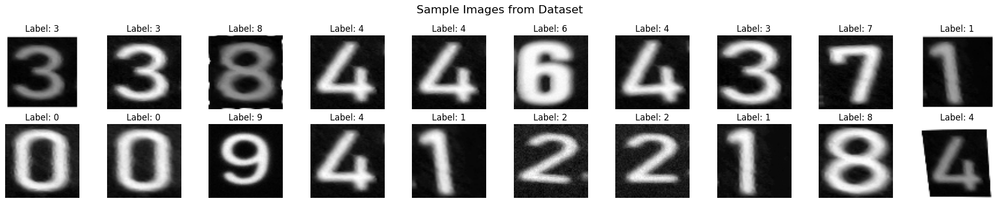

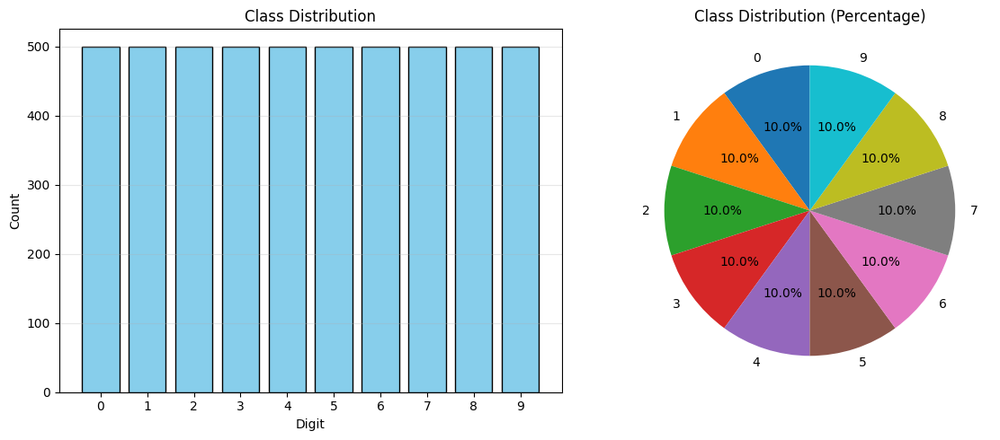

In [ ]:
def plot_sample_images(images, labels, num_samples=20):
    """Plot sample images from dataset"""
    fig, axes = plt.subplots(2, 10, figsize=(20, 4))
    fig.suptitle('Sample Images from Dataset', fontsize=16)

    indices = np.random.choice(len(images), num_samples, replace=False)

    for i, idx in enumerate(indices):
        ax = axes[i // 10, i % 10]
        ax.imshow(images[idx], cmap='gray')
        ax.set_title(f'Label: {labels[idx]}')
        ax.axis('off')

    plt.tight_layout()
    plt.show()

# Visualize samples
plot_sample_images(X, y)

# Plot class distribution
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
unique, counts = np.unique(y, return_counts=True)
plt.bar(unique, counts, color='skyblue', edgecolor='black')
plt.xlabel('Digit')
plt.ylabel('Count')
plt.title('Class Distribution')
plt.xticks(unique)
plt.grid(axis='y', alpha=0.3)

plt.subplot(1, 2, 2)
plt.pie(counts, labels=unique, autopct='%1.1f%%', startangle=90)
plt.title('Class Distribution (Percentage)')

plt.tight_layout()
plt.show()

In [ ]:
# Normalize pixel values to [0, 1]
X = X.astype('float32') / 255.0

# Reshape for CNN (add channel dimension)
X = X.reshape(-1, IMG_SIZE[0], IMG_SIZE[1], 1)

# One-hot encode labels
y_categorical = to_categorical(y, NUM_CLASSES)

# Split data into train and validation sets
X_train, X_val, y_train, y_val = train_test_split(
    X, y_categorical,
    test_size=VALIDATION_SPLIT,
    random_state=42,
    stratify=y
)

print("Data Preprocessing Complete!")
print(f"Training set shape: {X_train.shape}")
print(f"Validation set shape: {X_val.shape}")
print(f"Training labels shape: {y_train.shape}")
print(f"Validation labels shape: {y_val.shape}")

Data Preprocessing Complete!
Training set shape: (4000, 64, 64, 1)
Validation set shape: (1000, 64, 64, 1)
Training labels shape: (4000, 10)
Validation labels shape: (1000, 10)


Data Augmentation configured!
Training batches: 125
Validation batches: 32


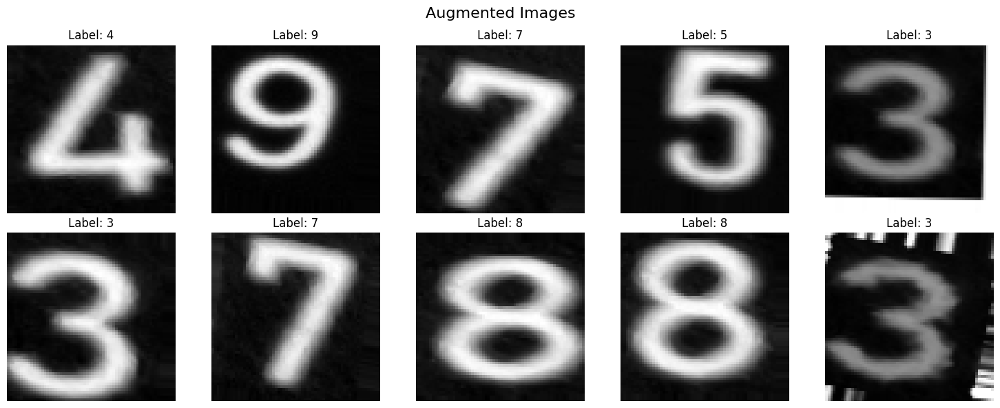

In [ ]:
# Create data augmentation generator
train_datagen = ImageDataGenerator(
    rotation_range=10,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.1,
    shear_range=0.1,
    fill_mode='nearest'
)

# Validation data (no augmentation)
val_datagen = ImageDataGenerator()

# Create generators
train_generator = train_datagen.flow(X_train, y_train, batch_size=BATCH_SIZE)
val_generator = val_datagen.flow(X_val, y_val, batch_size=BATCH_SIZE)

print("Data Augmentation configured!")
print(f"Training batches: {len(train_generator)}")
print(f"Validation batches: {len(val_generator)}")

# Visualize augmented images
def show_augmented_images(generator, num_samples=10):
    """Show augmented images"""
    X_batch, y_batch = next(generator)

    fig, axes = plt.subplots(2, 5, figsize=(15, 6))
    fig.suptitle('Augmented Images', fontsize=16)

    for i in range(num_samples):
        ax = axes[i // 5, i % 5]
        ax.imshow(X_batch[i].reshape(IMG_SIZE), cmap='gray')
        ax.set_title(f'Label: {np.argmax(y_batch[i])}')
        ax.axis('off')

    plt.tight_layout()
    plt.show()

show_augmented_images(train_generator)

In [ ]:
def build_cnn_model(input_shape, num_classes):
    """Build CNN model for digit recognition"""
    model = models.Sequential([
        # First Convolutional Block
        layers.Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=input_shape),
        layers.BatchNormalization(),
        layers.Conv2D(32, (3, 3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.25),

        # Second Convolutional Block
        layers.Conv2D(64, (3, 3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.Conv2D(64, (3, 3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.25),

        # Third Convolutional Block
        layers.Conv2D(128, (3, 3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.Conv2D(128, (3, 3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.25),

        # Flatten and Dense Layers
        layers.Flatten(),
        layers.Dense(256, activation='relu'),
        layers.BatchNormalization(),
        layers.Dropout(0.5),
        layers.Dense(128, activation='relu'),
        layers.BatchNormalization(),
        layers.Dropout(0.5),
        layers.Dense(num_classes, activation='softmax')
    ])

    return model

# Build model
input_shape = (IMG_SIZE[0], IMG_SIZE[1], 1)
model = build_cnn_model(input_shape, NUM_CLASSES)

# Compile model
model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=LEARNING_RATE),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Print model summary
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_6 (Conv2D)               │ (None, 64, 64, 32)     │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_8           │ (None, 64, 64, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 64, 64, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_9           │ (None, 64, 64, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 32, 32, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 32, 32, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 32, 32, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_10          │ (None, 32, 32, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 32, 32, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_11          │ (None, 32, 32, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 16, 16, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_12          │ (None, 16, 16, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 16, 16, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_13          │ (None, 16, 16, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 256)            │     2,097,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_14          │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 2,421,354 (9.24 MB)

 Trainable params: 2,419,690 (9.23 MB)

 Non-trainable params: 1,664 (6.50 KB)

In [ ]:
# Model checkpoint to save best model
checkpoint = ModelCheckpoint(
    MODEL_PATH,
    monitor='val_accuracy',
    save_best_only=True,
    mode='max',
    verbose=1
)

# Early stopping to prevent overfitting
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True,
    verbose=1
)

# Reduce learning rate on plateau
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=2,
    min_lr=1e-7,
    verbose=1
)

# TensorBoard for visualization
tensorboard = TensorBoard(
    log_dir=LOG_DIR,
    histogram_freq=1
)

callbacks = [checkpoint, early_stopping, reduce_lr, tensorboard]

print("Callbacks configured successfully!")

Callbacks configured successfully!


Starting training...
Epoch 1/50
123/125 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.5452 - loss: 1.6364
Epoch 1: val_accuracy improved from -inf to 0.10000, saving model to model_angka_ktm_best.keras
125/125 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step - accuracy: 0.5499 - loss: 1.6183 - val_accuracy: 0.1000 - val_loss: 3.5481 - learning_rate: 0.0010
Epoch 2/50
125/125 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.9386 - loss: 0.2107
Epoch 2: val_accuracy did not improve from 0.10000
125/125 ━━━━━━━━━━━━━━━━━━━━ 5s 43ms/step - accuracy: 0.9387 - loss: 0.2104 - val_accuracy: 0.1000 - val_loss: 4.1919 - learning_rate: 0.0010
Epoch 3/50
123/125 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.9807 - loss: 0.0911
Epoch 3: val_accuracy did not improve from 0.10000

Epoch 3: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
125/125 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - accuracy: 0.9808 - loss: 0.0906 - val_accuracy: 0.1000 - val_loss: 5.2751 - learning_rate: 0.0010
Epoch 4/50
123/1

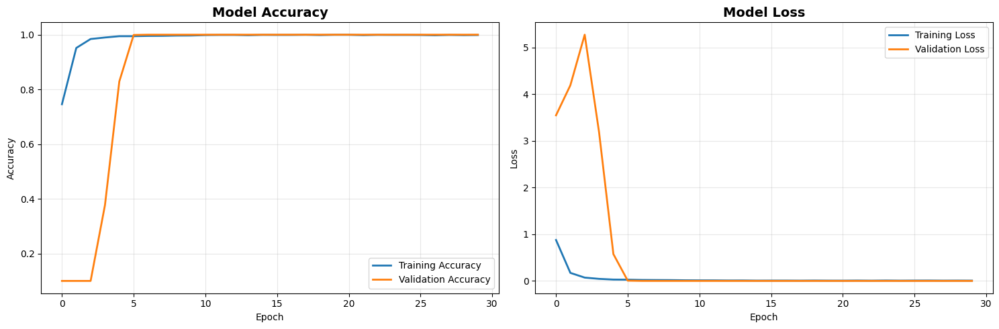


Final Training Metrics:
Training Accuracy: 0.9987
Validation Accuracy: 1.0000
Training Loss: 0.0064
Validation Loss: 0.0000


In [ ]:
print("Starting training...")
print("=" * 70)

history = model.fit(
    train_generator,
    epochs=EPOCHS,
    validation_data=val_generator,
    callbacks=callbacks,
    verbose=1
)

print("\nTraining completed!")


# ============================================================================
# CELL 10: Plot Training History
# ============================================================================
def plot_training_history(history):
    """Plot training and validation metrics"""
    fig, axes = plt.subplots(1, 2, figsize=(15, 5))

    # Accuracy plot
    axes[0].plot(history.history['accuracy'], label='Training Accuracy', linewidth=2)
    axes[0].plot(history.history['val_accuracy'], label='Validation Accuracy', linewidth=2)
    axes[0].set_title('Model Accuracy', fontsize=14, fontweight='bold')
    axes[0].set_xlabel('Epoch')
    axes[0].set_ylabel('Accuracy')
    axes[0].legend()
    axes[0].grid(True, alpha=0.3)

    # Loss plot
    axes[1].plot(history.history['loss'], label='Training Loss', linewidth=2)
    axes[1].plot(history.history['val_loss'], label='Validation Loss', linewidth=2)
    axes[1].set_title('Model Loss', fontsize=14, fontweight='bold')
    axes[1].set_xlabel('Epoch')
    axes[1].set_ylabel('Loss')
    axes[1].legend()
    axes[1].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    # Print final metrics
    print("\nFinal Training Metrics:")
    print(f"Training Accuracy: {history.history['accuracy'][-1]:.4f}")
    print(f"Validation Accuracy: {history.history['val_accuracy'][-1]:.4f}")
    print(f"Training Loss: {history.history['loss'][-1]:.4f}")
    print(f"Validation Loss: {history.history['val_loss'][-1]:.4f}")

plot_training_history(history)

In [ ]:
print("Evaluating model on validation set...")

# Load best model (now .keras format)
best_model = keras.models.load_model(MODEL_PATH)

# Evaluate
val_loss, val_accuracy = best_model.evaluate(X_val, y_val, verbose=0)
print(f"\nBest Model - Validation Accuracy: {val_accuracy:.4f}")
print(f"Best Model - Validation Loss: {val_loss:.4f}")

# Predictions
y_pred = best_model.predict(X_val, verbose=0)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = np.argmax(y_val, axis=1)

# Classification Report
print("\nClassification Report:")
print("=" * 70)
print(classification_report(y_true, y_pred_classes, target_names=[str(i) for i in range(NUM_CLASSES)]))

Evaluating model on validation set...

Best Model - Validation Accuracy: 1.0000
Best Model - Validation Loss: 0.0003

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       100
           1       1.00      1.00      1.00       100
           2       1.00      1.00      1.00       100
           3       1.00      1.00      1.00       100
           4       1.00      1.00      1.00       100
           5       1.00      1.00      1.00       100
           6       1.00      1.00      1.00       100
           7       1.00      1.00      1.00       100
           8       1.00      1.00      1.00       100
           9       1.00      1.00      1.00       100

    accuracy                           1.00      1000
   macro avg       1.00      1.00      1.00      1000
weighted avg       1.00      1.00      1.00      1000



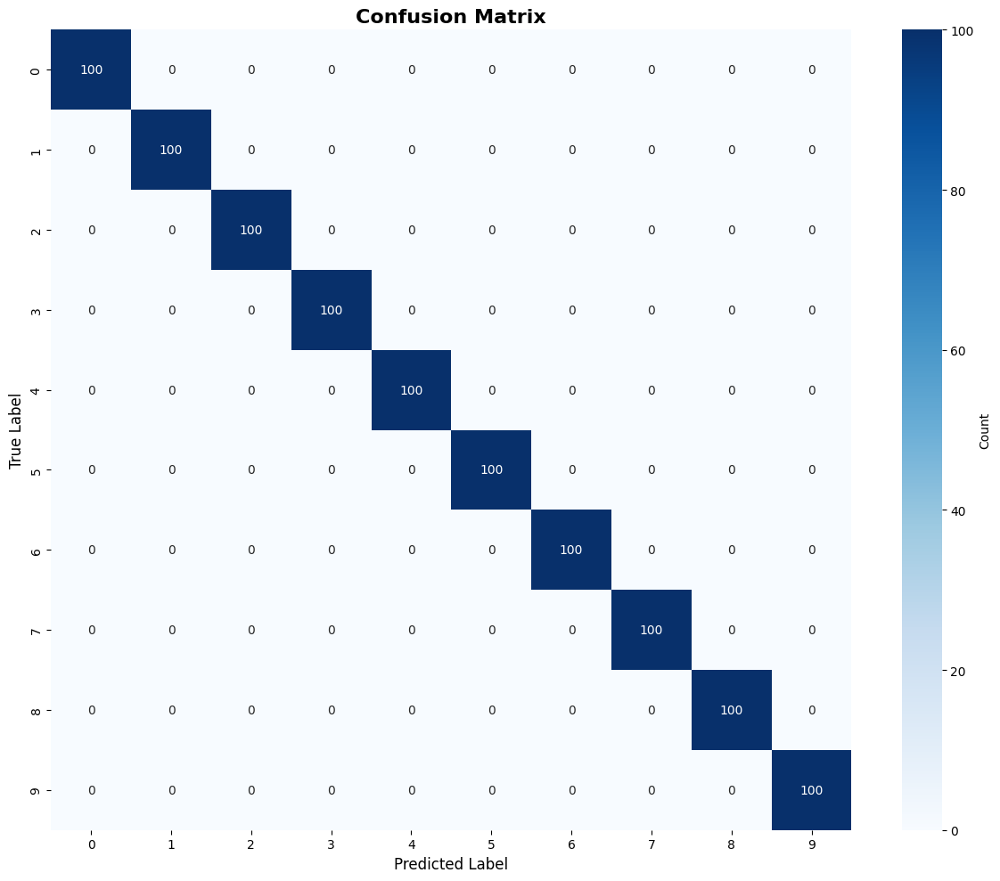


Per-Class Accuracy:
Digit 0: 1.0000 (100/100)
Digit 1: 1.0000 (100/100)
Digit 2: 1.0000 (100/100)
Digit 3: 1.0000 (100/100)
Digit 4: 1.0000 (100/100)
Digit 5: 1.0000 (100/100)
Digit 6: 1.0000 (100/100)
Digit 7: 1.0000 (100/100)
Digit 8: 1.0000 (100/100)
Digit 9: 1.0000 (100/100)


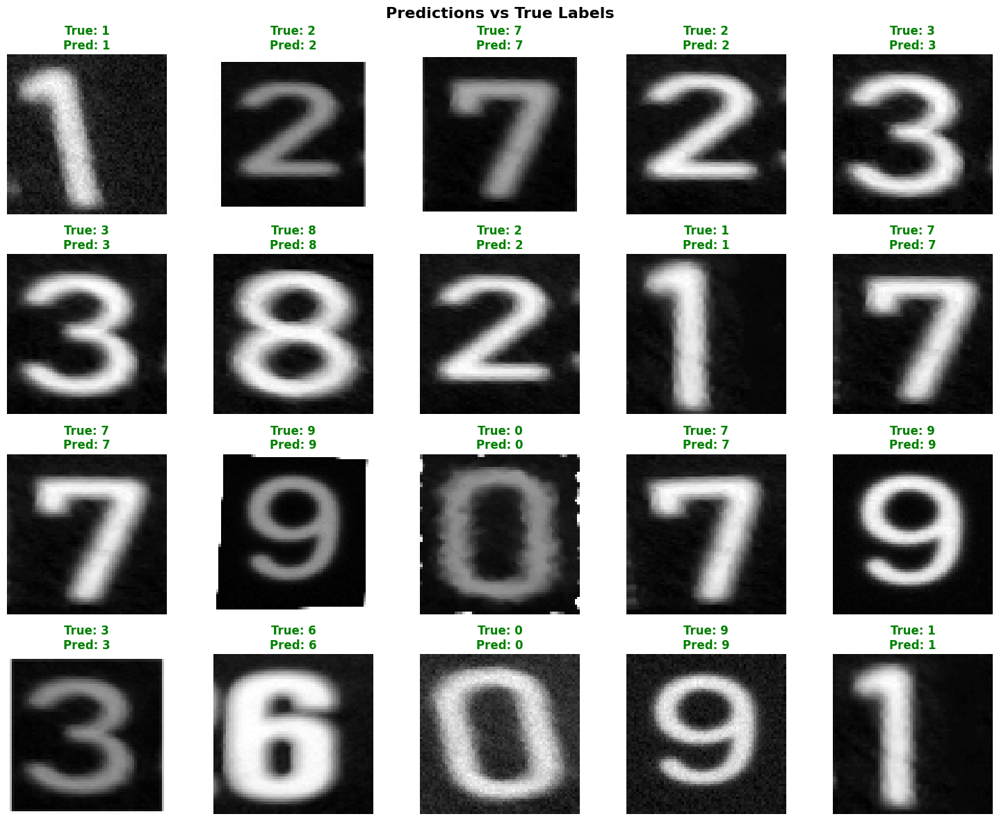

In [ ]:
# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred_classes)

# Plot confusion matrix
plt.figure(figsize=(12, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=range(NUM_CLASSES),
            yticklabels=range(NUM_CLASSES),
            cbar_kws={'label': 'Count'})
plt.title('Confusion Matrix', fontsize=16, fontweight='bold')
plt.ylabel('True Label', fontsize=12)
plt.xlabel('Predicted Label', fontsize=12)
plt.tight_layout()
plt.show()

# Calculate per-class accuracy
print("\nPer-Class Accuracy:")
print("=" * 50)
for i in range(NUM_CLASSES):
    class_accuracy = cm[i, i] / cm[i].sum() if cm[i].sum() > 0 else 0
    print(f"Digit {i}: {class_accuracy:.4f} ({cm[i, i]}/{cm[i].sum()})")


# ============================================================================
# CELL 13: Visualize Predictions
# ============================================================================
def plot_predictions(images, true_labels, pred_labels, num_samples=20):
    """Plot predictions with true labels"""
    fig, axes = plt.subplots(4, 5, figsize=(15, 12))
    fig.suptitle('Predictions vs True Labels', fontsize=16, fontweight='bold')

    indices = np.random.choice(len(images), num_samples, replace=False)

    for i, idx in enumerate(indices):
        ax = axes[i // 5, i % 5]
        ax.imshow(images[idx].reshape(IMG_SIZE), cmap='gray')

        true_label = true_labels[idx]
        pred_label = pred_labels[idx]

        color = 'green' if true_label == pred_label else 'red'
        ax.set_title(f'True: {true_label}\nPred: {pred_label}', color=color, fontweight='bold')
        ax.axis('off')

    plt.tight_layout()
    plt.show()

# Show predictions
plot_predictions(X_val, y_true, y_pred_classes)

# Show misclassified examples
misclassified_indices = np.where(y_true != y_pred_classes)[0]
if len(misclassified_indices) > 0:
    print(f"\nTotal Misclassified: {len(misclassified_indices)}")
    print("Showing misclassified examples...")

    num_show = min(20, len(misclassified_indices))
    selected_indices = misclassified_indices[:num_show]

    plot_predictions(X_val[selected_indices],
                    y_true[selected_indices],
                    y_pred_classes[selected_indices],
                    num_samples=num_show)

### INFERENSI

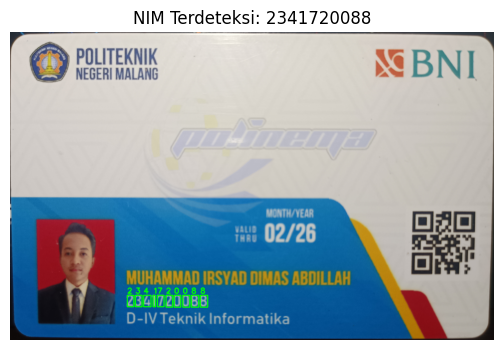

NIM: 2341720088


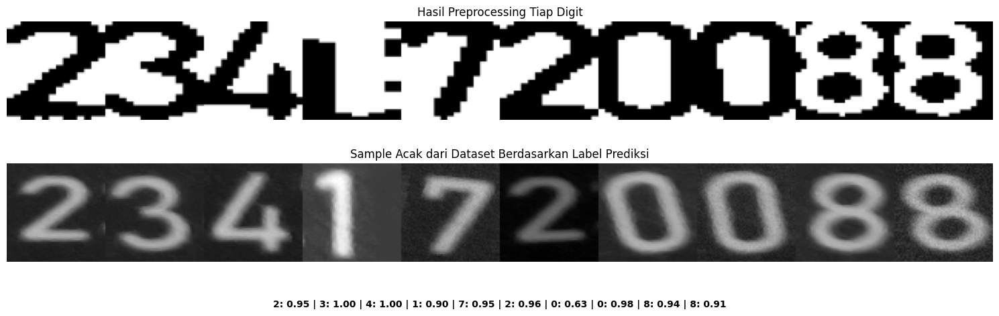

In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tensorflow import keras

# ============================================================================
# PREPROCESSING - TETAP SEDERHANA
# ============================================================================
def preprocess_digit_simple(digit_roi, img_size=(64, 64)):
    # --- Langkah 1: Normalisasi awal ---
    if len(digit_roi.shape) == 3:
        digit_roi = cv2.cvtColor(digit_roi, cv2.COLOR_BGR2GRAY)

    # Jika mayoritas piksel gelap → dibalik dulu
    dark_ratio = np.mean(digit_roi < 127)
    if dark_ratio > 0.5:
        digit_roi = cv2.bitwise_not(digit_roi)

    # --- Langkah 2: Threshold ---
    _, binary = cv2.threshold(digit_roi, 127, 255, cv2.THRESH_BINARY)

    # --- Langkah 3: Pastikan foreground = hitam ---
    # Hitung jumlah piksel putih dan hitam
    white_ratio = np.mean(binary == 255)
    black_ratio = np.mean(binary == 0)

    # Jika ternyata lebih banyak hitam → invert
    if black_ratio > white_ratio:
        binary = cv2.bitwise_not(binary)

    # --- Langkah 4: Crop ketat berdasarkan non-zero ---
    coords = cv2.findNonZero(255 - binary)
    if coords is not None:
        x, y, w, h = cv2.boundingRect(coords)
        binary = binary[y:y+h, x:x+w]

    # --- Langkah 5: Resize ke 28x28 ---
    binary = cv2.resize(binary, img_size, interpolation=cv2.INTER_AREA)
    return binary

# ============================================================================
# DETEKSI NIM - DENGAN PERBAIKAN
# ============================================================================
def detect_nim_only(image_path, model, img_size=(28, 28), debug=False):
    img = cv2.imread(image_path)
    if img is None:
        print("Gagal membaca gambar.")
        return None, None

    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    h, w = gray.shape

    # ROI NIM
    roi_y1 = int(h * 0.85)
    roi_y2 = int(h * 0.90)
    roi_x1 = int(w * 0.24)
    roi_x2 = int(w * 0.45)
    roi = gray[roi_y1:roi_y2, roi_x1:roi_x2]

    # Preprocessing ROI
    blur = cv2.GaussianBlur(roi, (3, 3), 0)
    _, thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    kernel = np.ones((2, 2), np.uint8)
    morph = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel, iterations=1)

    contours, _ = cv2.findContours(morph, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    results = []
    for cnt in contours:
        x, y, w, h = cv2.boundingRect(cnt)

        # Filter ukuran
        if h < 15 or w < 5:
            continue

        # Tight cropping untuk angka 1
        if h / w > 2.5:
            margin = int(w * 0.18)
            x += margin
            w -= 2 * margin
            if w < 4:
                w = 4

        # Extract digit
        digit = roi[y:y+h, x:x+w]
        processed = preprocess_digit_simple(digit, img_size)
        processed_norm = processed.astype('float32') / 255.0
        input_model = processed_norm.reshape(1, *img_size, 1)

        pred = model.predict(input_model, verbose=0)
        digit_pred = np.argmax(pred)
        confidence = pred[0][digit_pred]

        # Logika sederhana: 1 vs 7
        if digit_pred == 7 and h / w > 2.5:
            digit_pred = 1
            confidence = pred[0][1]

        results.append({
            'digit': digit_pred,
            'confidence': confidence,
            'bbox': (x + roi_x1, y + roi_y1, w, h)
        })

    # Urutkan dari kiri ke kanan
    results = sorted(results, key=lambda r: r['bbox'][0])

    if debug:
        plt.imshow(morph, cmap='gray')
        plt.title("Debug: ROI Setelah Preprocessing")
        plt.axis('off')
        plt.show()

    return img, results

# ============================================================================
# VISUALISASI HASIL KOMPARASI
# ============================================================================
def visualize_nim_results(img, results):
    if not results:
        print("Tidak ada digit yang terdeteksi.")
        return

    canvas = img.copy()
    number = ''.join([str(r['digit']) for r in results])

    for r in results:
        x, y, w, h = r['bbox']
        cv2.rectangle(canvas, (x, y), (x+w, y+h), (0, 255, 0), 2)
        cv2.putText(canvas, str(r['digit']), (x, y-5),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)

    plt.figure(figsize=(10, 4))
    plt.imshow(cv2.cvtColor(canvas, cv2.COLOR_BGR2RGB))
    plt.title(f"NIM Terdeteksi: {number}")
    plt.axis('off')
    plt.show()

    print("NIM:", number)

def visualize_digit_comparison(image_path, results, model, train_dir, img_size=(28, 28)):
    """
    Bandingkan hasil preprocess digit dengan sample acak dari dataset
    (file dataset: angka_{digit}_aug_{nomor}.jpg di folder flat)
    """
    import cv2, os, random
    import numpy as np
    import matplotlib.pyplot as plt

    if not results:
        print("Tidak ada digit yang terdeteksi.")
        return

    img = cv2.imread(image_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    processed_digits, sample_digits = [], []
    pred_labels, confidences = [], []

    for r in results:
        x, y, w, h = r['bbox']
        digit_roi = gray[y:y+h, x:x+w]

        # Preprocess seperti biasa
        processed = preprocess_digit_simple(digit_roi, img_size)
        processed_norm = processed.astype('float32') / 255.0
        input_model = processed_norm.reshape(1, *img_size, 1)

        pred = model.predict(input_model, verbose=0)
        digit_pred = np.argmax(pred)
        confidence = pred[0][digit_pred]

        processed_digits.append(processed)
        pred_labels.append(digit_pred)
        confidences.append(confidence)

        # ==========================================================
        # Cari sample acak di folder flat
        # ==========================================================
        candidates = [
            f for f in os.listdir(train_dir)
            if f.lower().endswith(('.png', '.jpg', '.jpeg'))
            and f"angka_{digit_pred}_aug_" in f.lower()
        ]

        if candidates:
            chosen = random.choice(candidates)
            sample_path = os.path.join(train_dir, chosen)
            sample_img = cv2.imread(sample_path, cv2.IMREAD_GRAYSCALE)
            if sample_img is not None:
                sample_img = cv2.resize(sample_img, img_size)
                sample_digits.append(sample_img)
                continue

        # fallback kosong kalau tidak ketemu
        sample_digits.append(np.zeros(img_size, dtype=np.uint8))

    # ==========================================================
    # Visualisasi
    # ==========================================================
    fig, axes = plt.subplots(2, 1, figsize=(max(6, len(results) * 1.5), 5))

    combined_proc = np.hstack(processed_digits)
    axes[0].imshow(combined_proc, cmap='gray')
    axes[0].set_title("Hasil Preprocessing Tiap Digit", fontsize=12)
    axes[0].axis('off')

    combined_sample = np.hstack(sample_digits)
    axes[1].imshow(combined_sample, cmap='gray')
    axes[1].set_title("Sample Acak dari Dataset Berdasarkan Label Prediksi", fontsize=12)
    axes[1].axis('off')

    conf_text = " | ".join([f"{lbl}: {conf:.2f}" for lbl, conf in zip(pred_labels, confidences)])
    fig.text(0.5, 0.03, conf_text, ha='center', fontsize=10, color='black', weight='bold')

    plt.tight_layout(rect=[0, 0.05, 1, 1])
    plt.show()

# ============================================================================
# MAIN
# ============================================================================
MODEL_PATH = '/content/drive/MyDrive/PCVK/Images/KTM/KTM NEW/model_angka_ktm_best.keras'
IMAGE_PATH = '/content/drive/MyDrive/PCVK/Images/KTM/KTM NEW/cropped_ktm.png'
TRAIN_DIR = '/content/drive/MyDrive/PCVK/Images/KTM/KTM NEW/TRAIN ANGKA'

model = keras.models.load_model(MODEL_PATH)
IMG_SIZE = (model.input_shape[1], model.input_shape[2])

img, results = detect_nim_only(IMAGE_PATH, model, img_size=IMG_SIZE, debug=False)
visualize_nim_results(img, results)
visualize_digit_comparison(IMAGE_PATH, results, model, TRAIN_DIR, img_size=IMG_SIZE)

### Test Dengan KTM lain

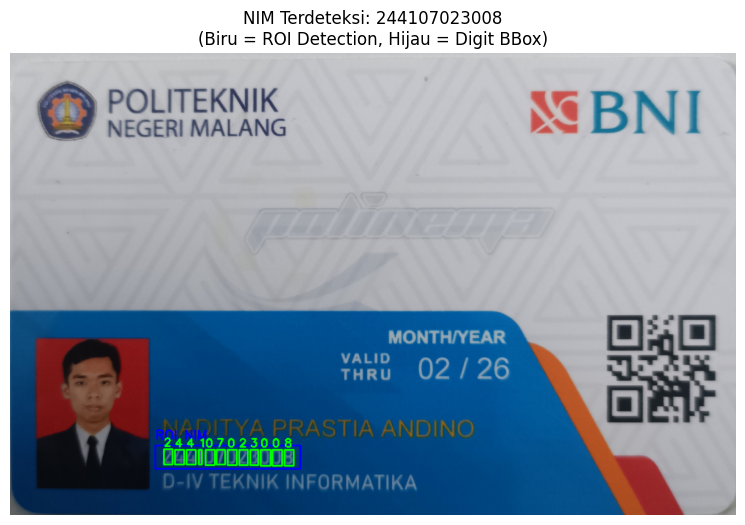

NIM: 244107023008


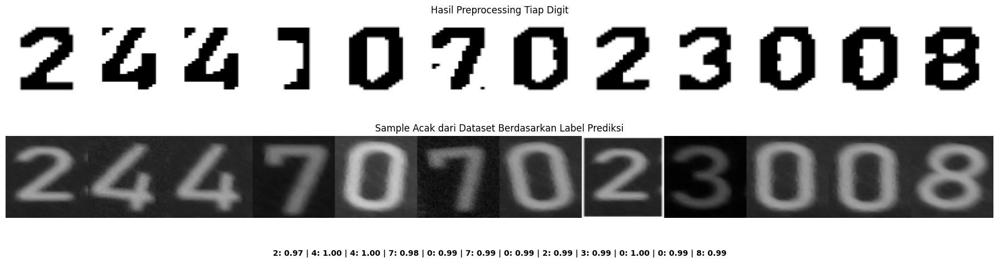

In [21]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tensorflow import keras

# ============================================================================
# PREPROCESSING - TETAP SEDERHANA
# ============================================================================
def preprocess_digit_simple(digit_roi, img_size=(64, 64)):
    # --- Langkah 1: Normalisasi awal ---
    if len(digit_roi.shape) == 3:
        digit_roi = cv2.cvtColor(digit_roi, cv2.COLOR_BGR2GRAY)

    # --- Langkah 2: Gaussian blur untuk mengurangi noise ---
    blurred = cv2.GaussianBlur(digit_roi, (3, 3), 0)

    # --- Langkah 3: Threshold adaptif (lebih baik dari OTSU untuk kontras rendah) ---
    binary = cv2.adaptiveThreshold(
        blurred, 255,
        cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
        cv2.THRESH_BINARY,
        11, 2
    )

    # --- Langkah 4: Pastikan background = putih, foreground = hitam ---
    border_pixels = np.concatenate([
        binary[0, :], binary[-1, :], binary[:, 0], binary[:, -1]
    ])

    if np.mean(border_pixels == 0) > 0.5:
        binary = cv2.bitwise_not(binary)

    # --- Langkah 5: Morphological cleaning untuk hapus noise kecil ---
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2, 2))
    binary = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel, iterations=1)
    binary = cv2.morphologyEx(binary, cv2.MORPH_CLOSE, kernel, iterations=1)

    # --- Langkah 6: Crop ketat berdasarkan foreground ---
    coords = cv2.findNonZero(255 - binary)
    if coords is not None:
        x, y, w, h = cv2.boundingRect(coords)
        binary = binary[y:y+h, x:x+w]

    # --- Langkah 7: Padding sedikit sebelum resize ---
    pad = 4
    binary = cv2.copyMakeBorder(binary, pad, pad, pad, pad,
                                cv2.BORDER_CONSTANT, value=255)

    # --- Langkah 8: Resize ke ukuran target ---
    binary = cv2.resize(binary, img_size, interpolation=cv2.INTER_AREA)

    return binary

# ============================================================================
# DETEKSI NIM - DENGAN PERBAIKAN
# ============================================================================
def detect_nim_only(image_path, model, img_size=(28, 28), debug=False):
    img = cv2.imread(image_path)
    if img is None:
        print("Gagal membaca gambar.")
        return None, None, None

    img = cv2.resize(img, (1186, 755), interpolation=cv2.INTER_AREA)

    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    h, w = gray.shape

    # ROI NIM
    roi_y1 = int(h * 0.85)
    roi_y2 = int(h * 0.90)
    roi_x1 = int(w * 0.20)  # Diubah dari 0.24 ke 0.15
    roi_x2 = int(w * 0.40)  # Diubah dari 0.45 ke 0.40
    roi = gray[roi_y1:roi_y2, roi_x1:roi_x2]

    # Simpan koordinat ROI untuk visualisasi
    roi_coords = (roi_x1, roi_y1, roi_x2, roi_y2)

    # Preprocessing ROI
    blur = cv2.GaussianBlur(roi, (3, 3), 0)
    _, thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    kernel = np.ones((2, 2), np.uint8)
    morph = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel, iterations=1)

    contours, _ = cv2.findContours(morph, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    results = []
    for cnt in contours:
        x, y, w, h = cv2.boundingRect(cnt)

        # Filter ukuran
        if h < 15 or w < 5:
            continue

        # Tight cropping untuk angka 1
        if h / w > 2.5:
            margin = int(w * 0.18)
            x += margin
            w -= 2 * margin
            if w < 4:
                w = 4

        # Extract digit
        digit = roi[y:y+h, x:x+w]
        processed = preprocess_digit_simple(digit, img_size)
        processed_norm = processed.astype('float32') / 255.0
        input_model = processed_norm.reshape(1, *img_size, 1)

        pred = model.predict(input_model, verbose=0)
        digit_pred = np.argmax(pred)
        confidence = pred[0][digit_pred]

        # Logika sederhana: 1 vs 7
        if digit_pred == 7 and h / w > 2.5:
            digit_pred = 1
            confidence = pred[0][1]

        results.append({
            'digit': digit_pred,
            'confidence': confidence,
            'bbox': (x + roi_x1, y + roi_y1, w, h)
        })

    # Urutkan dari kiri ke kanan
    results = sorted(results, key=lambda r: r['bbox'][0])

    if debug:
        plt.imshow(morph, cmap='gray')
        plt.title("Debug: ROI Setelah Preprocessing")
        plt.axis('off')
        plt.show()

    return img, results, roi_coords

# ============================================================================
# VISUALISASI HASIL KOMPARASI
# ============================================================================
def visualize_nim_results(img, results, roi_coords=None):
    if not results:
        print("Tidak ada digit yang terdeteksi.")
        return

    canvas = img.copy()
    number = ''.join([str(r['digit']) for r in results])

    # Gambar ROI box (biru) jika ada
    if roi_coords is not None:
        roi_x1, roi_y1, roi_x2, roi_y2 = roi_coords
        cv2.rectangle(canvas, (roi_x1, roi_y1), (roi_x2, roi_y2), (255, 0, 0), 2)
        cv2.putText(canvas, "ROI NIM", (roi_x1, roi_y1-10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 0, 0), 2)

    # Gambar bbox digit (hijau)
    for r in results:
        x, y, w, h = r['bbox']
        cv2.rectangle(canvas, (x, y), (x+w, y+h), (0, 255, 0), 2)
        cv2.putText(canvas, str(r['digit']), (x, y-5),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)

    plt.figure(figsize=(12, 6))
    plt.imshow(cv2.cvtColor(canvas, cv2.COLOR_BGR2RGB))
    plt.title(f"NIM Terdeteksi: {number}\n(Biru = ROI Detection, Hijau = Digit BBox)", fontsize=12)
    plt.axis('off')
    plt.show()

    print("NIM:", number)

def visualize_digit_comparison(image_path, results, model, train_dir, img_size=(28, 28)):
    """
    Bandingkan hasil preprocess digit dengan sample acak dari dataset
    (file dataset: angka_{digit}_aug_{nomor}.jpg di folder flat)
    """
    import cv2, os, random
    import numpy as np
    import matplotlib.pyplot as plt

    if not results:
        print("Tidak ada digit yang terdeteksi.")
        return

    # Baca dan resize gambar dengan cara yang SAMA seperti di detect_nim_only
    img = cv2.imread(image_path)
    img = cv2.resize(img, (1186, 755), interpolation=cv2.INTER_AREA)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    processed_digits, sample_digits = [], []
    pred_labels, confidences = [], []

    for r in results:
        x, y, w, h = r['bbox']
        digit_roi = gray[y:y+h, x:x+w]

        # Preprocess seperti biasa
        processed = preprocess_digit_simple(digit_roi, img_size)
        processed_norm = processed.astype('float32') / 255.0
        input_model = processed_norm.reshape(1, *img_size, 1)

        pred = model.predict(input_model, verbose=0)
        digit_pred = np.argmax(pred)
        confidence = pred[0][digit_pred]

        processed_digits.append(processed)
        pred_labels.append(digit_pred)
        confidences.append(confidence)

        # ==========================================================
        # Cari sample acak di folder flat
        # ==========================================================
        candidates = [
            f for f in os.listdir(train_dir)
            if f.lower().endswith(('.png', '.jpg', '.jpeg'))
            and f"angka_{digit_pred}_aug_" in f.lower()
        ]

        if candidates:
            chosen = random.choice(candidates)
            sample_path = os.path.join(train_dir, chosen)
            sample_img = cv2.imread(sample_path, cv2.IMREAD_GRAYSCALE)
            if sample_img is not None:
                sample_img = cv2.resize(sample_img, img_size)
                sample_digits.append(sample_img)
                continue

        # fallback kosong kalau tidak ketemu
        sample_digits.append(np.zeros(img_size, dtype=np.uint8))

    # ==========================================================
    # Visualisasi
    # ==========================================================
    fig, axes = plt.subplots(2, 1, figsize=(max(6, len(results) * 1.5), 5))

    combined_proc = np.hstack(processed_digits)
    axes[0].imshow(combined_proc, cmap='gray')
    axes[0].set_title("Hasil Preprocessing Tiap Digit", fontsize=12)
    axes[0].axis('off')

    combined_sample = np.hstack(sample_digits)
    axes[1].imshow(combined_sample, cmap='gray')
    axes[1].set_title("Sample Acak dari Dataset Berdasarkan Label Prediksi", fontsize=12)
    axes[1].axis('off')

    conf_text = " | ".join([f"{lbl}: {conf:.2f}" for lbl, conf in zip(pred_labels, confidences)])
    fig.text(0.5, 0.03, conf_text, ha='center', fontsize=10, color='black', weight='bold')

    plt.tight_layout(rect=[0, 0.05, 1, 1])
    plt.show()


# ============================================================================
# MAIN
# ============================================================================
MODEL_PATH = '/content/drive/MyDrive/PCVK/Images/KTM/KTM NEW/model_angka_ktm_best.keras'
IMAGE_PATH = '/content/drive/MyDrive/PCVK/Images/KTM/KTM NEW/IMG_20251105_095602.jpg'
TRAIN_DIR = '/content/drive/MyDrive/PCVK/Images/KTM/KTM NEW/TRAIN ANGKA'

model = keras.models.load_model(MODEL_PATH)
IMG_SIZE = (model.input_shape[1], model.input_shape[2])

img, results, roi_coords = detect_nim_only(IMAGE_PATH, model, img_size=IMG_SIZE, debug=False)
visualize_nim_results(img, results, roi_coords)
visualize_digit_comparison(IMAGE_PATH, results, model, TRAIN_DIR, img_size=IMG_SIZE)